# Visualizing the Data and Image counts

=== TRAIN CLASS COUNTS ===
buildings      : 2191
forest         : 2271
glacier        : 2404
mountain       : 2512
sea            : 2274
street         : 2382

=== TEST CLASS COUNTS ===
buildings      : 437
forest         : 474
glacier        : 553
mountain       : 525
sea            : 510
street         : 501

Total images in TRAIN: 14034 (82.39%)
Total images in TEST : 3000 (17.61%)


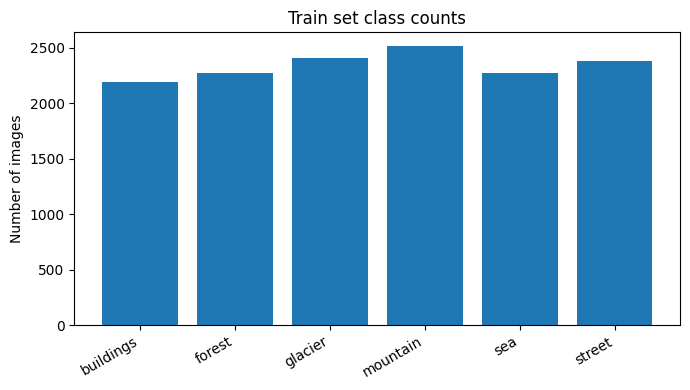

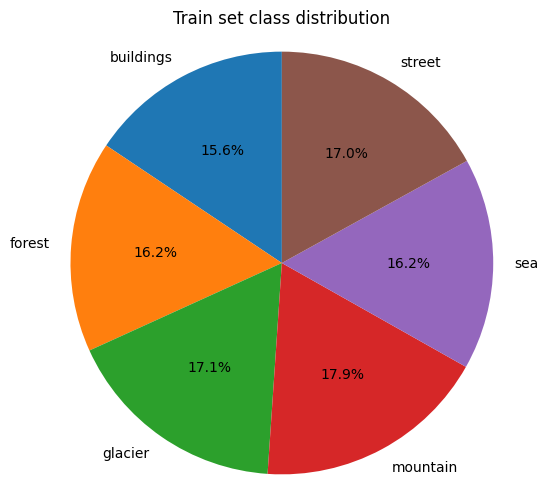

In [1]:
from pathlib import Path
import matplotlib.pyplot as plt


TRAIN_DIR = Path("/kaggle/input/intel-image-classification/seg_train/seg_train") 
TEST_DIR  = Path("/kaggle/input/intel-image-classification/seg_test/seg_test")    


# ---- Count images per class in train ----
train_class_counts = {}
for class_dir in TRAIN_DIR.iterdir():
    if class_dir.is_dir():
        n_images = sum(1 for p in class_dir.iterdir() if p.is_file())
        train_class_counts[class_dir.name] = n_images

# ---- Count images per class in test ----
test_class_counts = {}
for class_dir in TEST_DIR.iterdir():
    if class_dir.is_dir():
        n_images = sum(1 for p in class_dir.iterdir() if p.is_file())
        test_class_counts[class_dir.name] = n_images

# ---- Print counts ----
print("=== TRAIN CLASS COUNTS ===")
for cls, n in sorted(train_class_counts.items()):
    print(f"{cls:15s}: {n}")

print("\n=== TEST CLASS COUNTS ===")
for cls, n in sorted(test_class_counts.items()):
    print(f"{cls:15s}: {n}")

# ---- Overall train vs test percentage ----
total_train = sum(train_class_counts.values())
total_test = sum(test_class_counts.values())
total_all = total_train + total_test

train_pct = 100 * total_train / total_all
test_pct = 100 * total_test / total_all

print(f"\nTotal images in TRAIN: {total_train} ({train_pct:.2f}%)")
print(f"Total images in TEST : {total_test} ({test_pct:.2f}%)")

# ---- Bar chart for TRAIN classes ----
train_classes = sorted(train_class_counts.keys())
train_counts = [train_class_counts[c] for c in train_classes]

plt.figure(figsize=(7, 4))
plt.bar(train_classes, train_counts)
plt.ylabel("Number of images")
plt.title("Train set class counts")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()
plt.show()

# ---- Pie chart for TRAIN classes ----
plt.figure(figsize=(6, 6))
plt.pie(train_counts, labels=train_classes, autopct="%1.1f%%", startangle=90)
plt.title("Train set class distribution")
plt.axis("equal")
plt.show()

# Data Splitting(70,15,15) removing 4 images from Train set

In [2]:
from pathlib import Path
import shutil
import random

# ================== PATHS TO ORIGINAL DATA ==================
ORIG_TRAIN_DIR = Path("/kaggle/input/intel-image-classification/seg_train/seg_train")  
ORIG_TEST_DIR  = Path("/kaggle/input/intel-image-classification/seg_test/seg_test")   

NEW_ROOT = Path("/kaggle/working/Intel-image-classification")  # new dataset root
# ============================================================

random.seed(42)

# ---- Helper: count total images in a directory (class-wise folders) ----
def count_total(root):
    total = 0
    for class_dir in root.iterdir():
        if class_dir.is_dir():
            total += sum(1 for p in class_dir.iterdir() if p.is_file())
    return total

orig_train_total = count_total(ORIG_TRAIN_DIR)
orig_test_total = count_total(ORIG_TEST_DIR)
orig_total = orig_train_total + orig_test_total

print(f"Original TRAIN total: {orig_train_total}")
print(f"Original TEST total : {orig_test_total}")
print(f"Original TOTAL      : {orig_total}")

# ---- Choose 4 images from original train to drop (not used anywhere) ----
train_files_all = []
for class_dir in ORIG_TRAIN_DIR.iterdir():
    if class_dir.is_dir():
        for img_path in class_dir.iterdir():
            if img_path.is_file():
                train_files_all.append(img_path)

train_files_all = sorted(train_files_all)  # deterministic order
to_drop = set(train_files_all[:4])         # drop first 4
print(f"\nDropping {len(to_drop)} images from original train.")

# ---- Collect all remaining images (orig_train - 4 + orig_test) by class ----
all_files_by_class = {}  # class_name -> list of Paths

# From original train
for class_dir in ORIG_TRAIN_DIR.iterdir():
    if class_dir.is_dir():
        cname = class_dir.name
        all_files_by_class.setdefault(cname, [])
        for img_path in class_dir.iterdir():
            if img_path.is_file() and img_path not in to_drop:
                all_files_by_class[cname].append(img_path)

# From original test
for class_dir in ORIG_TEST_DIR.iterdir():
    if class_dir.is_dir():
        cname = class_dir.name
        all_files_by_class.setdefault(cname, [])
        for img_path in class_dir.iterdir():
            if img_path.is_file():
                all_files_by_class[cname].append(img_path)

new_total = sum(len(v) for v in all_files_by_class.values())
print(f"\nAfter dropping 4: using {new_total} images (should be {orig_total - 4}).")

# ---- Prepare new directory structure ----
for split in ["train", "val", "test"]:
    for cname in all_files_by_class.keys():
        out_dir = NEW_ROOT / split / cname
        out_dir.mkdir(parents=True, exist_ok=True)

# ---- Split 70 / 15 / 15 per class and copy files ----
train_ratio = 0.70
val_ratio = 0.15

new_counts = {"train": 0, "val": 0, "test": 0}

for cname, paths in all_files_by_class.items():
    paths = list(paths)
    random.shuffle(paths)
    n = len(paths)
    n_train = int(n * train_ratio)
    n_val = int(n * val_ratio)
    n_test = n - n_train - n_val  # ensure sum = n

    for i, src in enumerate(paths):
        if i < n_train:
            split = "train"
        elif i < n_train + n_val:
            split = "val"
        else:
            split = "test"

        dst = NEW_ROOT / split / cname / src.name
        shutil.copy2(src, dst)
        new_counts[split] += 1

# ---- Final check ----
print("\nNew split sizes:")
for split in ["train", "val", "test"]:
    print(f"{split:5s}: {new_counts[split]}")

print(f"Sum after split: {sum(new_counts.values())} (should be {new_total})")

Original TRAIN total: 14034
Original TEST total : 3000
Original TOTAL      : 17034

Dropping 4 images from original train.

After dropping 4: using 17030 images (should be 17030).

New split sizes:
train: 11917
val  : 2551
test : 2562
Sum after split: 17030 (should be 17030)


=== NEW TRAIN CLASS COUNTS ===
buildings      : 1836
forest         : 1921
glacier        : 2069
mountain       : 2125
sea            : 1948
street         : 2018


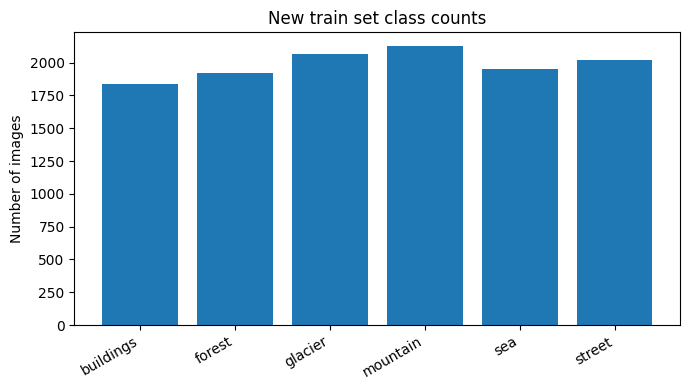

In [3]:
from pathlib import Path
import matplotlib.pyplot as plt

# Path to your NEW train directory
TRAIN_DIR = Path("/kaggle/working/Intel-image-classification/train")

# Count images per class
class_counts = {}
for class_dir in TRAIN_DIR.iterdir():
    if class_dir.is_dir():
        n_images = sum(1 for p in class_dir.iterdir() if p.is_file())
        class_counts[class_dir.name] = n_images

# Print counts
print("=== NEW TRAIN CLASS COUNTS ===")
for cls, n in sorted(class_counts.items()):
    print(f"{cls:15s}: {n}")

# Bar chart
classes = sorted(class_counts.keys())
counts = [class_counts[c] for c in classes]

plt.figure(figsize=(7, 4))
plt.bar(classes, counts)
plt.ylabel("Number of images")
plt.title("New train set class counts")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()
plt.show()

# Phase A: Baseline With EfficientNet B2

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Train samples: 11917
Val samples:   2551
Test samples:  2562
Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth


100%|██████████| 35.2M/35.2M [00:00<00:00, 161MB/s]


Epoch [01/30] - 97.0s | Train loss: 0.4394, acc: 0.8652 | Val loss: 0.2110, acc: 0.9263
Epoch [02/30] - 100.7s | Train loss: 0.1864, acc: 0.9386 | Val loss: 0.1917, acc: 0.9349
Epoch [03/30] - 100.5s | Train loss: 0.1384, acc: 0.9536 | Val loss: 0.1952, acc: 0.9345
Epoch [04/30] - 101.4s | Train loss: 0.1019, acc: 0.9633 | Val loss: 0.2088, acc: 0.9345
Epoch [05/30] - 100.9s | Train loss: 0.0757, acc: 0.9732 | Val loss: 0.2327, acc: 0.9314
Epoch [06/30] - 101.1s | Train loss: 0.0637, acc: 0.9781 | Val loss: 0.2322, acc: 0.9365
Epoch [07/30] - 101.0s | Train loss: 0.0473, acc: 0.9836 | Val loss: 0.2469, acc: 0.9345
Epoch [08/30] - 100.5s | Train loss: 0.0434, acc: 0.9841 | Val loss: 0.2986, acc: 0.9283
Epoch [09/30] - 100.8s | Train loss: 0.0326, acc: 0.9898 | Val loss: 0.2980, acc: 0.9298
Epoch [10/30] - 101.1s | Train loss: 0.0372, acc: 0.9872 | Val loss: 0.2857, acc: 0.9365
Epoch [11/30] - 101.4s | Train loss: 0.0253, acc: 0.9914 | Val loss: 0.2835, acc: 0.9377
Epoch [12/30] - 101.0s

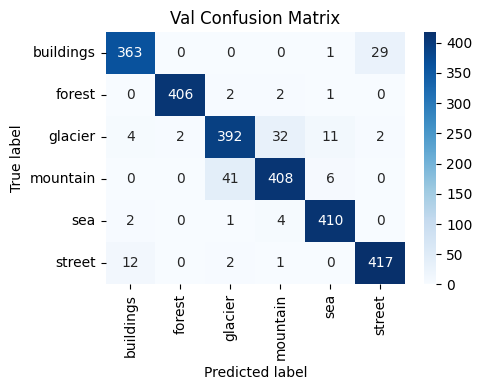


=== TEST CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

   buildings     0.9627    0.9139    0.9377       395
      forest     0.9832    0.9927    0.9880       413
     glacier     0.8836    0.8697    0.8766       445
    mountain     0.8931    0.8775    0.8852       457
         sea     0.9510    0.9737    0.9623       419
      street     0.9273    0.9723    0.9493       433

    accuracy                         0.9321      2562
   macro avg     0.9335    0.9333    0.9332      2562
weighted avg     0.9320    0.9321    0.9318      2562

test accuracy: 0.9321


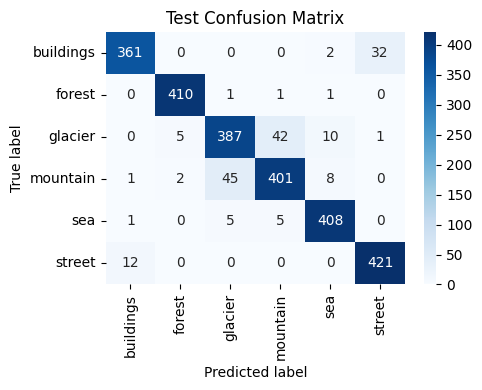

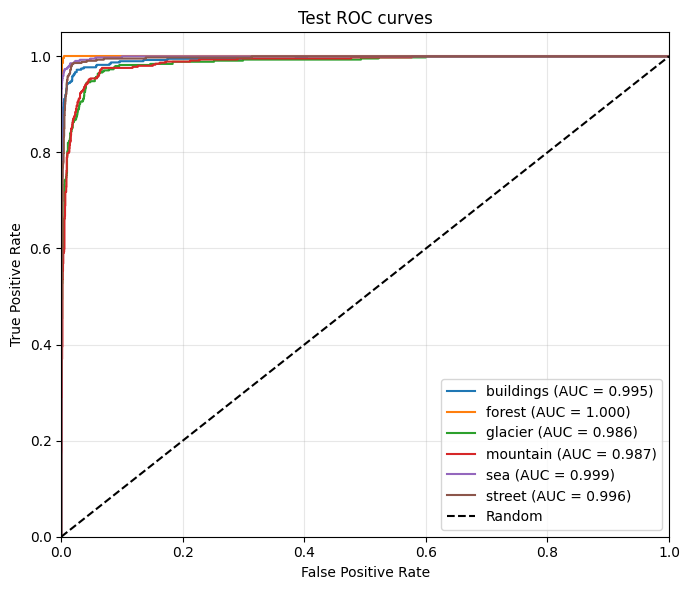


=== TEST AUC SCORES ===
Class buildings      : AUC = 0.9946
Class forest         : AUC = 0.9999
Class glacier        : AUC = 0.9864
Class mountain       : AUC = 0.9870
Class sea            : AUC = 0.9990
Class street         : AUC = 0.9964
Macro-average AUC: 0.9939


In [4]:
from pathlib import Path
import time

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
)
from sklearn.preprocessing import label_binarize

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TRAIN_DIR = DATA_ROOT / "train"
VAL_DIR   = DATA_ROOT / "val"
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 224
BATCH_SIZE  = 32
NUM_WORKERS = 2
NUM_EPOCHS  = 30
LR          = 1e-4
WEIGHT_DECAY = 1e-4
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Transforms ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),  # ~256
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# --------- Datasets & Dataloaders ---------
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=VAL_DIR,   transform=eval_transforms)
test_dataset  = datasets.ImageFolder(root=TEST_DIR,  transform=eval_transforms)

class_names = train_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print(f"Train samples: {len(train_dataset)}")
print(f"Val samples:   {len(val_dataset)}")
print(f"Test samples:  {len(test_dataset)}")

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

# --------- Model ---------
weights = EfficientNet_B2_Weights.IMAGENET1K_V1
model = efficientnet_b2(weights=weights)

in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

# --------- Training / Validation loops ---------
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in dataloader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        logits = model(images)
        loss = loss_fn(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total

def evaluate_epoch(model, dataloader, loss_fn, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            logits = model(images)
            loss = loss_fn(logits, labels)
            running_loss += loss.item() * images.size(0)
            preds = logits.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return running_loss / total, correct / total

best_val_acc = 0.0
best_model_path = "efficientnet_b2_baseline_best.pth"

for epoch in range(1, NUM_EPOCHS + 1):
    start = time.time()
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc     = evaluate_epoch(model, val_loader, criterion, device)
    elapsed = time.time() - start

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] - {elapsed:.1f}s | "
        f"Train loss: {train_loss:.4f}, acc: {train_acc:.4f} | "
        f"Val loss: {val_loss:.4f}, acc: {val_acc:.4f}"
    )

print("Best val acc:", best_val_acc)

# --------- Load best model ---------
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.to(device)
model.eval()

# --------- Evaluation helpers ---------
def get_all_predictions(model, dataloader, device):
    model.eval()
    all_logits = []
    all_labels = []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            logits = model(images)
            all_logits.append(logits.cpu())
            all_labels.append(labels.cpu())
    all_logits = torch.cat(all_logits, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    y_proba = F.softmax(all_logits, dim=1).numpy()
    y_pred = np.argmax(y_proba, axis=1)
    y_true = all_labels.numpy()
    return y_true, y_pred, y_proba

def evaluate_split(model, dataloader, class_names, device, split_name="val"):
    y_true, y_pred, y_proba = get_all_predictions(model, dataloader, device)

    print(f"\n=== {split_name.upper()} CLASSIFICATION REPORT ===")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    acc = (y_true == y_pred).mean()
    print(f"{split_name} accuracy: {acc:.4f}")

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(f"{split_name.capitalize()} Confusion Matrix")
    plt.tight_layout()
    plt.show()

    return y_true, y_pred, y_proba

def plot_multiclass_roc_auc(y_true, y_proba, class_names, split_name="test"):
    n_classes = len(class_names)
    y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

    fpr, tpr, auc_scores = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        auc_scores[i] = roc_auc_score(y_true_bin[:, i], y_proba[:, i])
    macro_auc = np.mean(list(auc_scores.values()))

    plt.figure(figsize=(7, 6))
    for i in range(n_classes):
        plt.plot(
            fpr[i],
            tpr[i],
            label=f"{class_names[i]} (AUC = {auc_scores[i]:.3f})",
        )
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{split_name.capitalize()} ROC curves")
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"\n=== {split_name.upper()} AUC SCORES ===")
    for i in range(n_classes):
        print(f"Class {class_names[i]:15s}: AUC = {auc_scores[i]:.4f}")
    print(f"Macro-average AUC: {macro_auc:.4f}")

# --------- Evaluate on VAL and TEST ---------
y_val_true, y_val_pred, y_val_proba = evaluate_split(
    model, val_loader, class_names, device, split_name="val"
)

y_test_true, y_test_pred, y_test_proba = evaluate_split(
    model, test_loader, class_names, device, split_name="test"
)

plot_multiclass_roc_auc(
    y_test_true, y_test_proba, class_names, split_name="test"
)

# Phase B Applying Augmentations

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Train samples: 11917
Val samples:   2551
Test samples:  2562
Epoch [01/30] - 101.7s | Train loss: 0.4646, acc: 0.8527 | Val loss: 0.2081, acc: 0.9287, F1(macro): 0.9291
Epoch [02/30] - 101.2s | Train loss: 0.2283, acc: 0.9194 | Val loss: 0.1917, acc: 0.9322, F1(macro): 0.9326
Epoch [03/30] - 101.6s | Train loss: 0.1823, acc: 0.9364 | Val loss: 0.1742, acc: 0.9381, F1(macro): 0.9387
Epoch [04/30] - 101.0s | Train loss: 0.1430, acc: 0.9480 | Val loss: 0.1879, acc: 0.9381, F1(macro): 0.9387
Epoch [05/30] - 101.4s | Train loss: 0.1176, acc: 0.9580 | Val loss: 0.1969, acc: 0.9322, F1(macro): 0.9332
Epoch [06/30] - 101.5s | Train loss: 0.1019, acc: 0.9652 | Val loss: 0.2028, acc: 0.9365, F1(macro): 0.9376
Epoch [07/30] - 101.8s | Train loss: 0.0873, acc: 0.9694 | Val loss: 0.2204, acc: 0.9298, F1(macro): 0.9309
Epoch [08/30] - 101.3s | Train loss: 0.0786, acc: 0.9726 | Val loss: 0.2171, acc: 0.9341, F

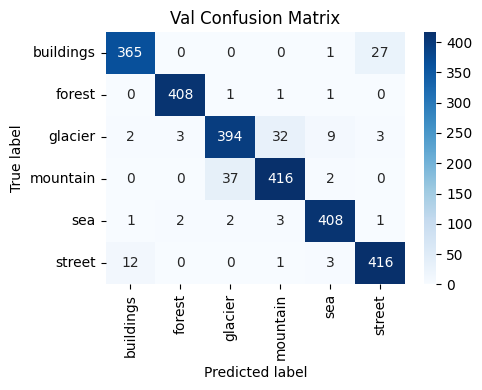


=== TEST CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

   buildings     0.9549    0.9114    0.9326       395
      forest     0.9903    0.9879    0.9891       413
     glacier     0.8852    0.9011    0.8931       445
    mountain     0.9044    0.8906    0.8975       457
         sea     0.9760    0.9714    0.9737       419
      street     0.9183    0.9607    0.9391       433

    accuracy                         0.9364      2562
   macro avg     0.9382    0.9372    0.9375      2562
weighted avg     0.9368    0.9364    0.9364      2562

test accuracy: 0.9364
test F1 (macro): 0.9375


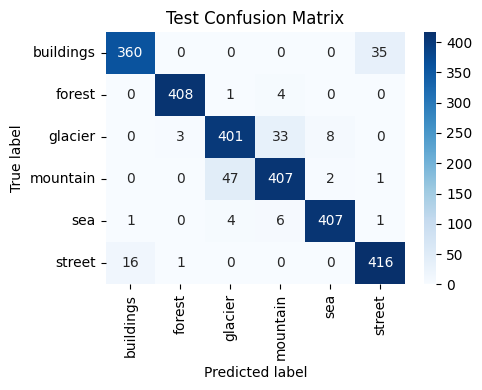

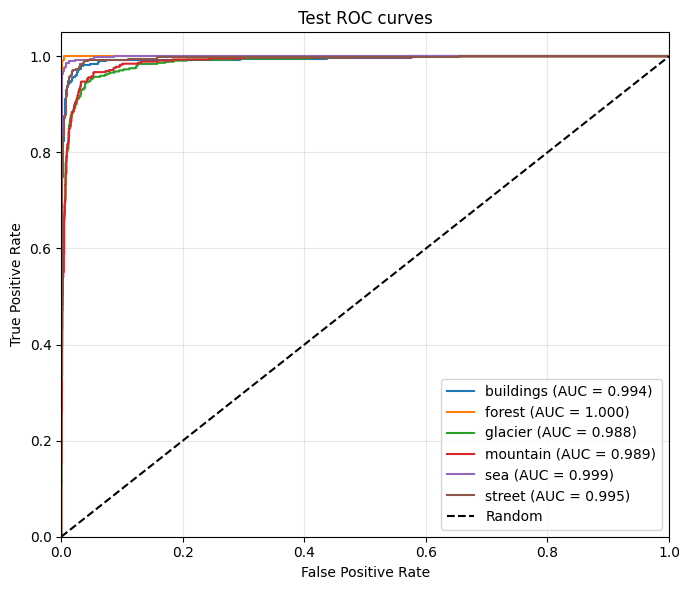


=== TEST AUC SCORES ===
Class buildings      : AUC = 0.9938
Class forest         : AUC = 0.9999
Class glacier        : AUC = 0.9878
Class mountain       : AUC = 0.9890
Class sea            : AUC = 0.9991
Class street         : AUC = 0.9952
Macro-average AUC: 0.9941


In [5]:
from pathlib import Path
import time

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    f1_score,
)
from sklearn.preprocessing import label_binarize

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TRAIN_DIR = DATA_ROOT / "train"
VAL_DIR   = DATA_ROOT / "val"
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 224
BATCH_SIZE  = 32
NUM_WORKERS = 4
NUM_EPOCHS  = 30
LR          = 1e-4
WEIGHT_DECAY = 1e-4
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Transforms (ADVANCED AUGMENTATIONS) ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    # Geometric
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.6, 1.0), ratio=(0.75, 1.33)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),
    
    # Color
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.02,
    ),
    
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
    
    # Regularization-style
    transforms.RandomErasing(
        p=0.2,
        scale=(0.02, 0.08),
        ratio=(0.3, 3.3),
        value="random",
    ),
])

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),  # ~256
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# --------- Datasets & Dataloaders ---------
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=VAL_DIR,   transform=eval_transforms)
test_dataset  = datasets.ImageFolder(root=TEST_DIR,  transform=eval_transforms)

class_names = train_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print(f"Train samples: {len(train_dataset)}")
print(f"Val samples:   {len(val_dataset)}")
print(f"Test samples:  {len(test_dataset)}")

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

# --------- Model ---------
weights = EfficientNet_B2_Weights.IMAGENET1K_V1
model = efficientnet_b2(weights=weights)

in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

# --------- Training / Validation loops ---------
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in dataloader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        logits = model(images)
        loss = loss_fn(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total

def evaluate_epoch(model, dataloader, loss_fn, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            logits = model(images)
            loss = loss_fn(logits, labels)

            running_loss += loss.item() * images.size(0)
            preds = logits.argmax(dim=1)

            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())

    epoch_loss = running_loss / total
    epoch_acc  = correct / total

    all_preds  = torch.cat(all_preds).numpy()
    all_labels = torch.cat(all_labels).numpy()
    epoch_f1   = f1_score(all_labels, all_preds, average="macro")

    return epoch_loss, epoch_acc, epoch_f1

best_val_f1 = 0.0
best_model_path = "efficientnet_b2_phaseB_best_f1.pth"

for epoch in range(1, NUM_EPOCHS + 1):
    start = time.time()
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc, val_f1 = evaluate_epoch(model, val_loader, criterion, device)
    elapsed = time.time() - start

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        torch.save(model.state_dict(), best_model_path)

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] - {elapsed:.1f}s | "
        f"Train loss: {train_loss:.4f}, acc: {train_acc:.4f} | "
        f"Val loss: {val_loss:.4f}, acc: {val_acc:.4f}, F1(macro): {val_f1:.4f}"
    )

print("Best val F1 (macro, Phase B):", best_val_f1)

# --------- Load best model (by val F1) ---------
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.to(device)
model.eval()

# --------- Evaluation helpers ---------
def get_all_predictions(model, dataloader, device):
    model.eval()
    all_logits = []
    all_labels = []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            logits = model(images)
            all_logits.append(logits.cpu())
            all_labels.append(labels.cpu())
    all_logits = torch.cat(all_logits, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    y_proba = F.softmax(all_logits, dim=1).numpy()
    y_pred = np.argmax(y_proba, axis=1)
    y_true = all_labels.numpy()
    return y_true, y_pred, y_proba

def evaluate_split(model, dataloader, class_names, device, split_name="val"):
    y_true, y_pred, y_proba = get_all_predictions(model, dataloader, device)

    print(f"\n=== {split_name.upper()} CLASSIFICATION REPORT ===")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    acc = (y_true == y_pred).mean()
    macro_f1 = f1_score(y_true, y_pred, average="macro")
    print(f"{split_name} accuracy: {acc:.4f}")
    print(f"{split_name} F1 (macro): {macro_f1:.4f}")

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(f"{split_name.capitalize()} Confusion Matrix")
    plt.tight_layout()
    plt.show()

    return y_true, y_pred, y_proba

def plot_multiclass_roc_auc(y_true, y_proba, class_names, split_name="test"):
    n_classes = len(class_names)
    y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

    fpr, tpr, auc_scores = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        auc_scores[i] = roc_auc_score(y_true_bin[:, i], y_proba[:, i])
    macro_auc = np.mean(list(auc_scores.values()))

    plt.figure(figsize=(7, 6))
    for i in range(n_classes):
        plt.plot(
            fpr[i],
            tpr[i],
            label=f"{class_names[i]} (AUC = {auc_scores[i]:.3f})",
        )
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{split_name.capitalize()} ROC curves")
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"\n=== {split_name.upper()} AUC SCORES ===")
    for i in range(n_classes):
        print(f"Class {class_names[i]:15s}: AUC = {auc_scores[i]:.4f}")
    print(f"Macro-average AUC: {macro_auc:.4f}")

# --------- Final evaluation on VAL and TEST ---------
y_val_true,  y_val_pred,  y_val_proba  = evaluate_split(
    model, val_loader,  class_names, device, split_name="val"
)
y_test_true, y_test_pred, y_test_proba = evaluate_split(
    model, test_loader, class_names, device, split_name="test"
)
plot_multiclass_roc_auc(
    y_test_true, y_test_proba, class_names, split_name="test"
)

# Using same augmentation but increase img size 224 -> 260

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Train samples: 11917
Val samples:   2551
Test samples:  2562
Epoch [01/30] - 146.1s | Train loss: 0.4397, acc: 0.8660 | Val loss: 0.2000, acc: 0.9294, F1(macro): 0.9300
Epoch [02/30] - 146.4s | Train loss: 0.2120, acc: 0.9252 | Val loss: 0.1916, acc: 0.9365, F1(macro): 0.9367
Epoch [03/30] - 146.6s | Train loss: 0.1692, acc: 0.9408 | Val loss: 0.1768, acc: 0.9416, F1(macro): 0.9421
Epoch [04/30] - 146.4s | Train loss: 0.1429, acc: 0.9494 | Val loss: 0.1778, acc: 0.9436, F1(macro): 0.9441
Epoch [05/30] - 146.6s | Train loss: 0.1198, acc: 0.9568 | Val loss: 0.1776, acc: 0.9408, F1(macro): 0.9414
Epoch [06/30] - 145.6s | Train loss: 0.0987, acc: 0.9646 | Val loss: 0.2014, acc: 0.9428, F1(macro): 0.9435
Epoch [07/30] - 147.0s | Train loss: 0.0808, acc: 0.9716 | Val loss: 0.2111, acc: 0.9373, F1(macro): 0.9383
Epoch [08/30] - 146.9s | Train loss: 0.0684, acc: 0.9754 | Val loss: 0.2264, acc: 0.9404, F

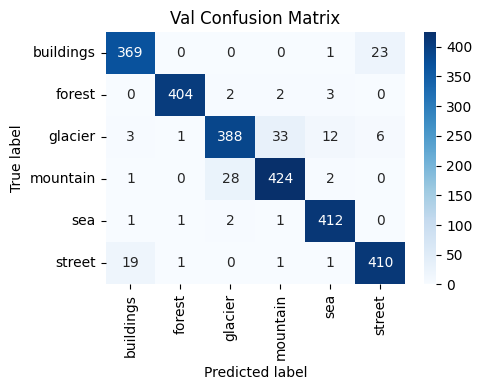


=== TEST CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

   buildings     0.9738    0.9418    0.9575       395
      forest     0.9903    0.9879    0.9891       413
     glacier     0.9023    0.8719    0.8869       445
    mountain     0.8879    0.9015    0.8947       457
         sea     0.9581    0.9833    0.9706       419
      street     0.9482    0.9723    0.9601       433

    accuracy                         0.9418      2562
   macro avg     0.9435    0.9431    0.9431      2562
weighted avg     0.9418    0.9418    0.9417      2562

test accuracy: 0.9418
test F1 (macro): 0.9431


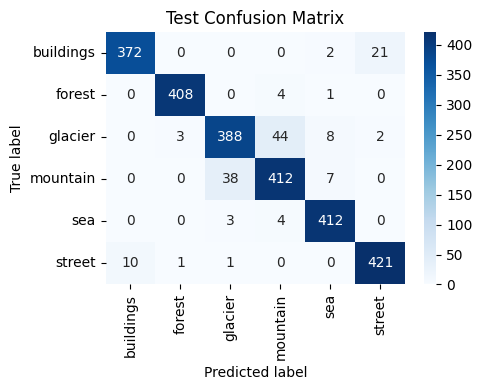

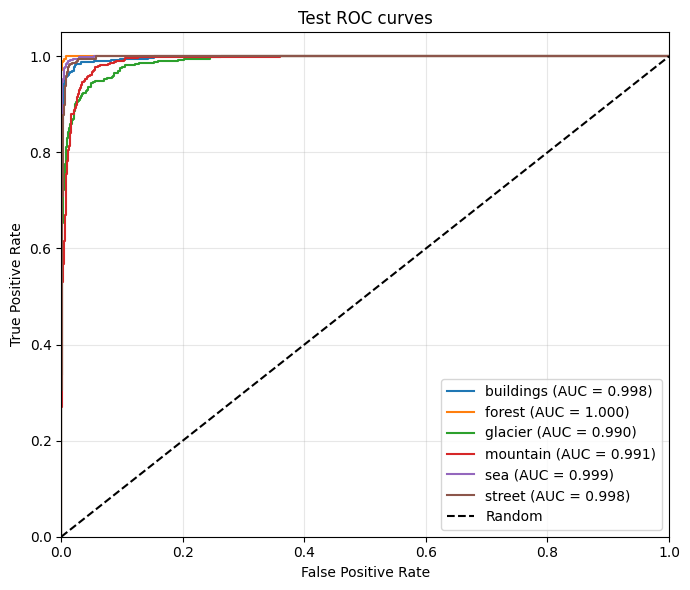


=== TEST AUC SCORES ===
Class buildings      : AUC = 0.9976
Class forest         : AUC = 0.9999
Class glacier        : AUC = 0.9895
Class mountain       : AUC = 0.9908
Class sea            : AUC = 0.9994
Class street         : AUC = 0.9977
Macro-average AUC: 0.9958


In [6]:
from pathlib import Path
import time

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    f1_score,
)
from sklearn.preprocessing import label_binarize

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TRAIN_DIR = DATA_ROOT / "train"
VAL_DIR   = DATA_ROOT / "val"
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 260
BATCH_SIZE  = 32
NUM_WORKERS = 4
NUM_EPOCHS  = 30
LR          = 1e-4
WEIGHT_DECAY = 1e-4
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Transforms (ADVANCED AUGMENTATIONS) ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    # Geometric
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.6, 1.0), ratio=(0.75, 1.33)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),
    
    # Color
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.02,
    ),
    
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
    
    # Regularization-style
    transforms.RandomErasing(
        p=0.2,
        scale=(0.02, 0.08),
        ratio=(0.3, 3.3),
        value="random",
    ),
])

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),  # ~256
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# --------- Datasets & Dataloaders ---------
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=VAL_DIR,   transform=eval_transforms)
test_dataset  = datasets.ImageFolder(root=TEST_DIR,  transform=eval_transforms)

class_names = train_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print(f"Train samples: {len(train_dataset)}")
print(f"Val samples:   {len(val_dataset)}")
print(f"Test samples:  {len(test_dataset)}")

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

# --------- Model ---------
weights = EfficientNet_B2_Weights.IMAGENET1K_V1
model = efficientnet_b2(weights=weights)

in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

# --------- Training / Validation loops ---------
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in dataloader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        logits = model(images)
        loss = loss_fn(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total

def evaluate_epoch(model, dataloader, loss_fn, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            logits = model(images)
            loss = loss_fn(logits, labels)

            running_loss += loss.item() * images.size(0)
            preds = logits.argmax(dim=1)

            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())

    epoch_loss = running_loss / total
    epoch_acc  = correct / total

    all_preds  = torch.cat(all_preds).numpy()
    all_labels = torch.cat(all_labels).numpy()
    epoch_f1   = f1_score(all_labels, all_preds, average="macro")

    return epoch_loss, epoch_acc, epoch_f1

best_val_f1 = 0.0
best_model_path = "efficientnet_b2_phaseB260_best_f1.pth"

for epoch in range(1, NUM_EPOCHS + 1):
    start = time.time()
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc, val_f1 = evaluate_epoch(model, val_loader, criterion, device)
    elapsed = time.time() - start

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        torch.save(model.state_dict(), best_model_path)

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] - {elapsed:.1f}s | "
        f"Train loss: {train_loss:.4f}, acc: {train_acc:.4f} | "
        f"Val loss: {val_loss:.4f}, acc: {val_acc:.4f}, F1(macro): {val_f1:.4f}"
    )

print("Best val F1 (macro, Phase B):", best_val_f1)

# --------- Load best model (by val F1) ---------
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.to(device)
model.eval()

# --------- Evaluation helpers ---------
def get_all_predictions(model, dataloader, device):
    model.eval()
    all_logits = []
    all_labels = []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            logits = model(images)
            all_logits.append(logits.cpu())
            all_labels.append(labels.cpu())
    all_logits = torch.cat(all_logits, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    y_proba = F.softmax(all_logits, dim=1).numpy()
    y_pred = np.argmax(y_proba, axis=1)
    y_true = all_labels.numpy()
    return y_true, y_pred, y_proba

def evaluate_split(model, dataloader, class_names, device, split_name="val"):
    y_true, y_pred, y_proba = get_all_predictions(model, dataloader, device)

    print(f"\n=== {split_name.upper()} CLASSIFICATION REPORT ===")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    acc = (y_true == y_pred).mean()
    macro_f1 = f1_score(y_true, y_pred, average="macro")
    print(f"{split_name} accuracy: {acc:.4f}")
    print(f"{split_name} F1 (macro): {macro_f1:.4f}")

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(f"{split_name.capitalize()} Confusion Matrix")
    plt.tight_layout()
    plt.show()

    return y_true, y_pred, y_proba

def plot_multiclass_roc_auc(y_true, y_proba, class_names, split_name="test"):
    n_classes = len(class_names)
    y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

    fpr, tpr, auc_scores = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        auc_scores[i] = roc_auc_score(y_true_bin[:, i], y_proba[:, i])
    macro_auc = np.mean(list(auc_scores.values()))

    plt.figure(figsize=(7, 6))
    for i in range(n_classes):
        plt.plot(
            fpr[i],
            tpr[i],
            label=f"{class_names[i]} (AUC = {auc_scores[i]:.3f})",
        )
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{split_name.capitalize()} ROC curves")
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"\n=== {split_name.upper()} AUC SCORES ===")
    for i in range(n_classes):
        print(f"Class {class_names[i]:15s}: AUC = {auc_scores[i]:.4f}")
    print(f"Macro-average AUC: {macro_auc:.4f}")

# --------- Final evaluation on VAL and TEST ---------
y_val_true,  y_val_pred,  y_val_proba  = evaluate_split(
    model, val_loader,  class_names, device, split_name="val"
)
y_test_true, y_test_pred, y_test_proba = evaluate_split(
    model, test_loader, class_names, device, split_name="test"
)
plot_multiclass_roc_auc(
    y_test_true, y_test_proba, class_names, split_name="test"
)

# X-AI

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Test samples: 2562
Model loaded from: /kaggle/working/efficientnet_b2_phaseB260_best_f1.pth


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Image index: 1507
True label: mountain, Predicted: mountain


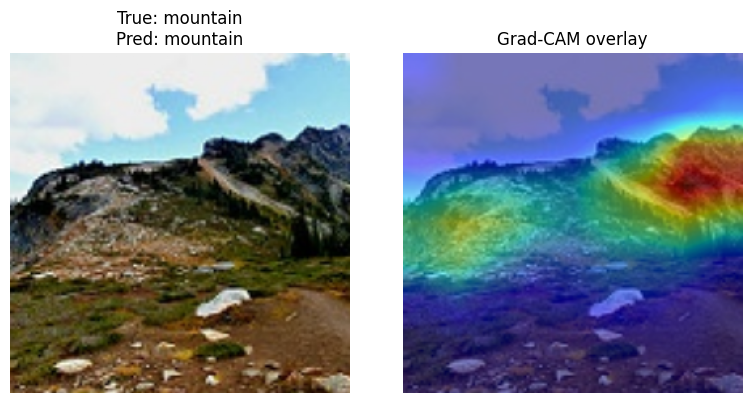

Image index: 85
True label: buildings, Predicted: buildings


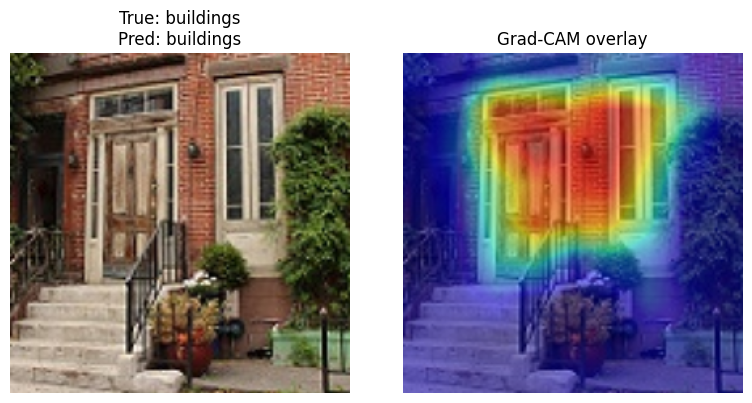

Image index: 1768
True label: sea, Predicted: sea


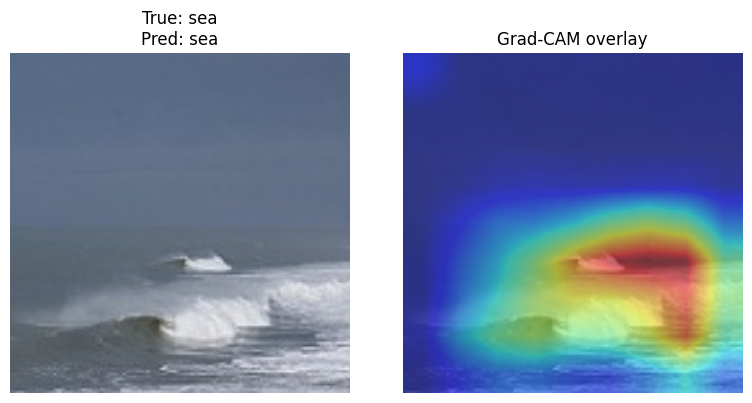

Image index: 1228
True label: glacier, Predicted: glacier


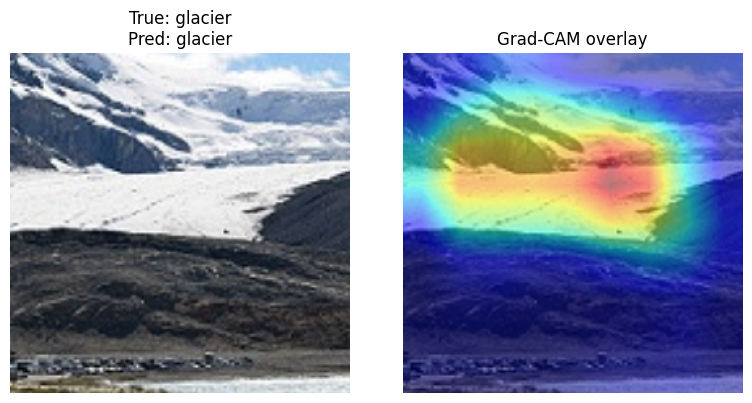

Image index: 589
True label: forest, Predicted: forest


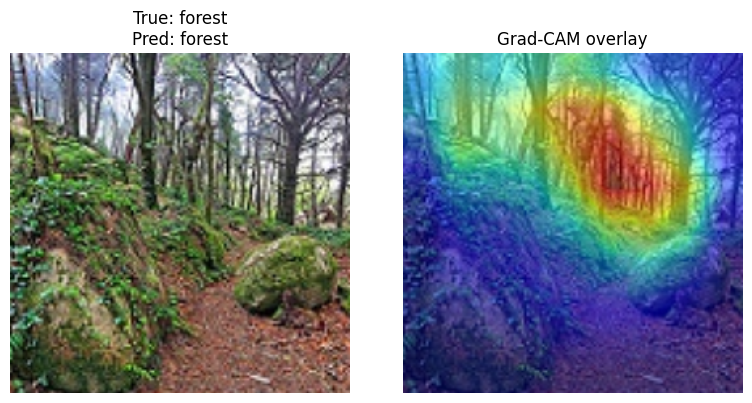

Image index: 174
True label: buildings, Predicted: buildings


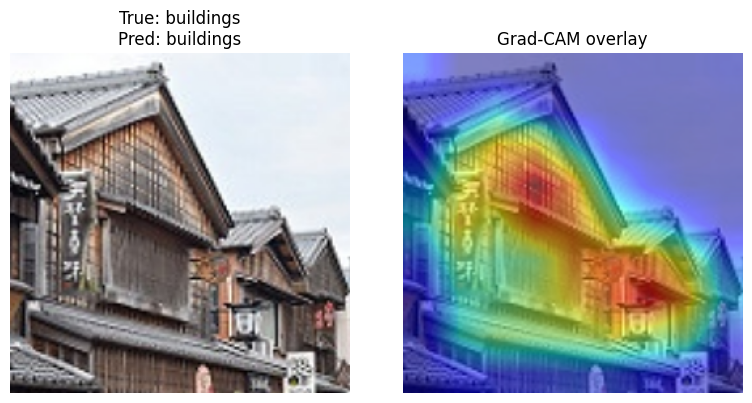

Image index: 1883
True label: sea, Predicted: sea


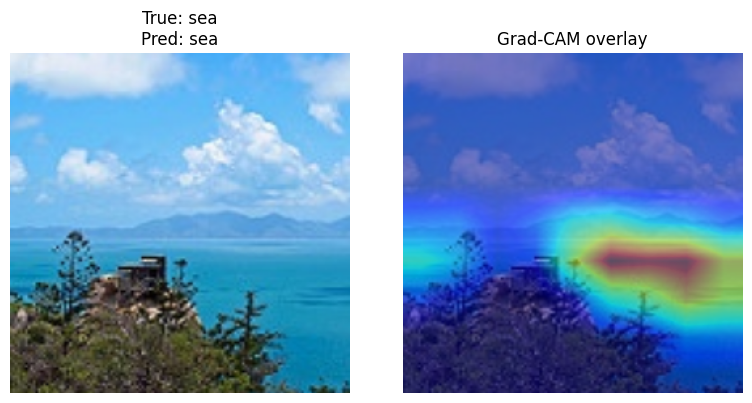

Image index: 1680
True label: mountain, Predicted: sea


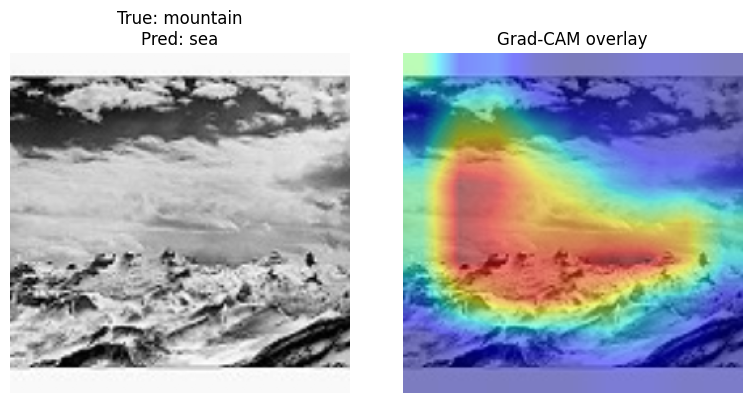

Image index: 2217
True label: street, Predicted: street


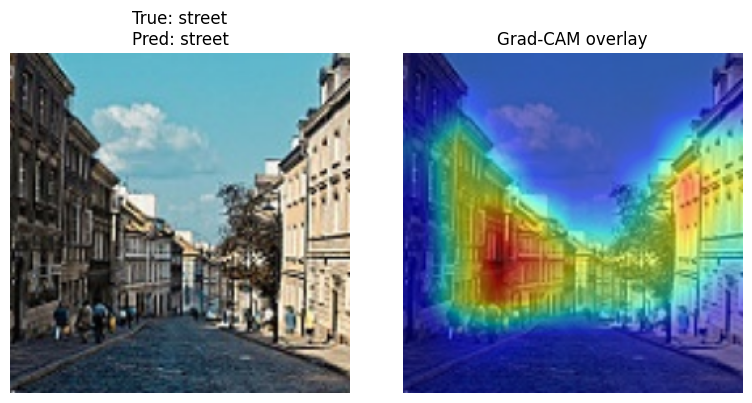

Image index: 929
True label: glacier, Predicted: glacier


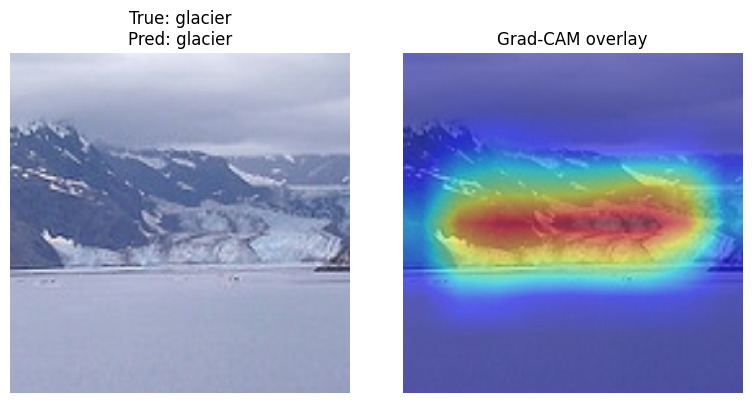

In [7]:
from pathlib import Path

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 260          # must match training
BATCH_SIZE  = 32
NUM_WORKERS = 4

CKPT_PATH   = "/kaggle/working/efficientnet_b2_phaseB260_best_f1.pth"  # your saved weights
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Eval transforms (same as training eval) ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),  # ~296
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# For visualization (no normalization, but same resize/crop)
vis_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),
    transforms.CenterCrop(IMG_SIZE),
])

# --------- Dataset & Dataloader (for class names and paths) ---------
test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=eval_transforms)
test_loader  = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

class_names = test_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print(f"Test samples: {len(test_dataset)}")

# --------- Rebuild model and load weights ---------
weights = EfficientNet_B2_Weights.IMAGENET1K_V1
model = efficientnet_b2(weights=weights)
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model = model.to(device)

state_dict = torch.load(CKPT_PATH, map_location=device)
model.load_state_dict(state_dict)
model.eval()

print("Model loaded from:", CKPT_PATH)


import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

class GradCAM:
    def __init__(self, model, target_layer):
        """
        model: nn.Module
        target_layer: layer/module whose activations to use for CAM (e.g., model.features[-1])
        """
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.activations = out.detach()

        def backward_hook(module, grad_in, grad_out):
            # grad_out is a tuple; we want the gradient wrt the output
            self.gradients = grad_out[0].detach()

        self.hook_handles.append(
            self.target_layer.register_forward_hook(forward_hook)
        )
        self.hook_handles.append(
            self.target_layer.register_backward_hook(backward_hook)
        )

    def __del__(self):
        for h in self.hook_handles:
            h.remove()

    def generate(self, input_tensor, target_class=None):
        """
        input_tensor: [1, 3, H, W] tensor on the same device as model
        target_class: int, if None uses model's predicted class
        Returns: (cam_np, target_class)
          cam_np: [H_feat, W_feat] numpy array in [0, 1]
        """
        self.model.eval()
        self.model.zero_grad()

        output = self.model(input_tensor)  # [1, num_classes]
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        score = output[0, target_class]
        score.backward()

        # activations, gradients: [1, C, H, W]
        grads = self.gradients[0]      # [C, H, W]
        acts  = self.activations[0]    # [C, H, W]

        # Global average pool the gradients over spatial dims
        weights = grads.mean(dim=(1, 2))  # [C]

        # Compute weighted sum of activations
        cam = torch.zeros(acts.shape[1:], dtype=torch.float32, device=acts.device)
        for c, w in enumerate(weights):
            cam += w * acts[c, :, :]

        cam = F.relu(cam)

        # Normalize to [0, 1]
        cam -= cam.min()
        cam /= (cam.max() + 1e-8)

        return cam.cpu().numpy(), target_class


def show_gradcam_on_image(pil_img, cam, pred_class, true_class, class_names,
                          alpha=0.5, title_prefix=""):
    """
    pil_img: original PIL image
    cam: [H_feat, W_feat] numpy, in [0, 1]
    pred_class, true_class: int indices
    """
    # Apply the same resize/crop as eval (but without normalization)
    img_vis = vis_transforms(pil_img)
    img_np = np.array(img_vis).astype(np.float32) / 255.0  # [H, W, 3]

    # Resize cam to image size
    cam_resized = torch.tensor(cam).unsqueeze(0).unsqueeze(0)
    cam_resized = F.interpolate(
        cam_resized,
        size=(img_np.shape[0], img_np.shape[1]),
        mode="bilinear",
        align_corners=False,
    ).squeeze().numpy()

    cam_resized = np.clip(cam_resized, 0, 1)

    # Apply colormap
    heatmap = plt.cm.jet(cam_resized)[..., :3]  # drop alpha channel

    # Overlay
    overlay = alpha * heatmap + (1 - alpha) * img_np
    overlay = np.clip(overlay, 0, 1)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.axis("off")
    plt.title(f"{title_prefix}True: {class_names[true_class]}\nPred: {class_names[pred_class]}")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Grad-CAM overlay")
    plt.tight_layout()
    plt.show()


import random

# Instantiate Grad-CAM on the last feature block of EfficientNet-B2
target_layer = model.features[-1]
gradcam = GradCAM(model, target_layer=target_layer)

# How many test images to visualize
N_SAMPLES = 10

for _ in range(N_SAMPLES):
    idx = random.randint(0, len(test_dataset) - 1)
    img_path, true_label = test_dataset.samples[idx]

    pil_img = Image.open(img_path).convert("RGB")

    # Prepare input tensor for the model
    input_tensor = eval_transforms(pil_img).unsqueeze(0).to(device)

    # Forward to get prediction
    with torch.no_grad():
        logits = model(input_tensor)
        pred_class = logits.argmax(dim=1).item()

    # Grad-CAM for the predicted class
    cam, target_class = gradcam.generate(input_tensor, target_class=pred_class)

    print(f"Image index: {idx}")
    print(f"True label: {class_names[true_label]}, Predicted: {class_names[pred_class]}")

    show_gradcam_on_image(
        pil_img,
        cam,
        pred_class=pred_class,
        true_class=true_label,
        class_names=class_names,
        alpha=0.5,
        title_prefix="",
    )



# Phase C: Model Customization ->  EfficientNet‑B2 + CBAM on final feature map + GAP+GMP + small MLP head

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Train samples: 11917
Val samples:   2551
Test samples:  2562
Epoch [01/30] - 148.9s | Train loss: 0.4742, acc: 0.8335 | Val loss: 0.2379, acc: 0.9173, F1(macro): 0.9180
Epoch [02/30] - 147.7s | Train loss: 0.2495, acc: 0.9129 | Val loss: 0.1982, acc: 0.9314, F1(macro): 0.9323
Epoch [03/30] - 148.9s | Train loss: 0.1996, acc: 0.9312 | Val loss: 0.1796, acc: 0.9365, F1(macro): 0.9373
Epoch [04/30] - 148.5s | Train loss: 0.1705, acc: 0.9411 | Val loss: 0.1986, acc: 0.9353, F1(macro): 0.9359
Epoch [05/30] - 148.7s | Train loss: 0.1515, acc: 0.9476 | Val loss: 0.2046, acc: 0.9357, F1(macro): 0.9363
Epoch [06/30] - 148.4s | Train loss: 0.1342, acc: 0.9527 | Val loss: 0.1958, acc: 0.9365, F1(macro): 0.9373
Epoch [07/30] - 148.7s | Train loss: 0.1141, acc: 0.9608 | Val loss: 0.2069, acc: 0.9330, F1(macro): 0.9342
Epoch [08/30] - 148.8s | Train loss: 0.1005, acc: 0.9663 | Val loss: 0.2034, acc: 0.9373, F

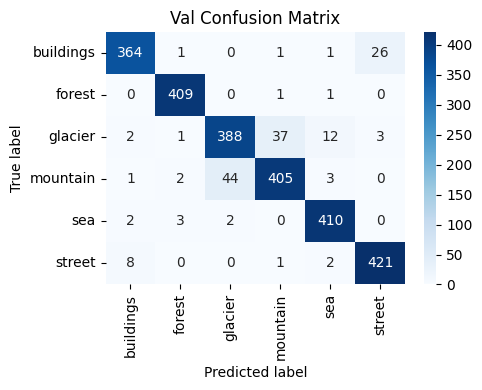


=== TEST CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

   buildings     0.9758    0.9190    0.9465       395
      forest     0.9808    0.9903    0.9855       413
     glacier     0.8937    0.8876    0.8906       445
    mountain     0.9020    0.8862    0.8940       457
         sea     0.9694    0.9833    0.9763       419
      street     0.9278    0.9792    0.9528       433

    accuracy                         0.9399      2562
   macro avg     0.9416    0.9409    0.9410      2562
weighted avg     0.9400    0.9399    0.9397      2562

test accuracy: 0.9399
test F1 (macro): 0.9410


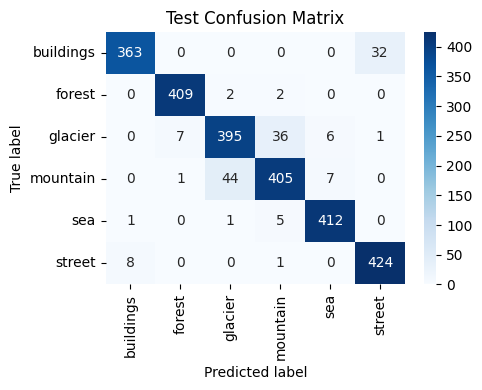

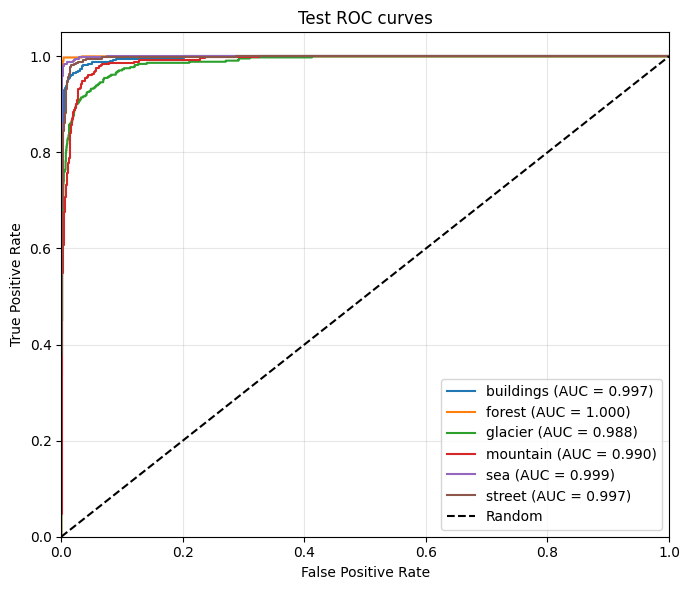


=== TEST AUC SCORES ===
Class buildings      : AUC = 0.9966
Class forest         : AUC = 0.9998
Class glacier        : AUC = 0.9876
Class mountain       : AUC = 0.9903
Class sea            : AUC = 0.9994
Class street         : AUC = 0.9969
Macro-average AUC: 0.9951


In [8]:
from pathlib import Path
import time

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    f1_score,
)
from sklearn.preprocessing import label_binarize

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TRAIN_DIR = DATA_ROOT / "train"
VAL_DIR   = DATA_ROOT / "val"
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 260   # change to 260 if you want to test native B2 resolution
BATCH_SIZE  = 32
NUM_WORKERS = 4
NUM_EPOCHS  = 30
LR          = 1e-4
WEIGHT_DECAY = 1e-4
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Transforms (same advanced augmentations as Phase B) ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.6, 1.0), ratio=(0.75, 1.33)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.02,
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
    transforms.RandomErasing(
        p=0.2,
        scale=(0.02, 0.08),
        ratio=(0.3, 3.3),
        value="random",
    ),
])

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# --------- Datasets & Dataloaders ---------
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=VAL_DIR,   transform=eval_transforms)
test_dataset  = datasets.ImageFolder(root=TEST_DIR,  transform=eval_transforms)

class_names = train_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print(f"Train samples: {len(train_dataset)}")
print(f"Val samples:   {len(val_dataset)}")
print(f"Test samples:  {len(test_dataset)}")

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

# --------- CBAM modules ---------
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        hidden = max(in_channels // reduction, 1)
        self.mlp = nn.Sequential(
            nn.Linear(in_channels, hidden, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(hidden, in_channels, bias=False),
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg = self.avg_pool(x).view(b, c)
        mx  = self.max_pool(x).view(b, c)
        att = self.mlp(avg) + self.mlp(mx)
        att = self.sigmoid(att).view(b, c, 1, 1)
        return x * att


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = (kernel_size - 1) // 2
        self.conv = nn.Conv2d(2, 1, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg = torch.mean(x, dim=1, keepdim=True)
        mx, _ = torch.max(x, dim=1, keepdim=True)
        x_cat = torch.cat([avg, mx], dim=1)
        att = self.conv(x_cat)
        att = self.sigmoid(att)
        return x * att


class CBAM(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super().__init__()
        self.ca = ChannelAttention(in_channels, reduction=reduction)
        self.sa = SpatialAttention(kernel_size=kernel_size)

    def forward(self, x):
        x = self.ca(x)
        x = self.sa(x)
        return x

# --------- EfficientNet-B2 with CBAM + GAP+GMP + small MLP head ---------
class EffNetB2_CBAM_Head(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        base = efficientnet_b2(weights=EfficientNet_B2_Weights.IMAGENET1K_V1)
        self.features = base.features

        feat_channels = base.classifier[1].in_features  # channel dim before original FC
        self.cbam = CBAM(feat_channels, reduction=16, kernel_size=7)

        self.gap = nn.AdaptiveAvgPool2d(1)
        self.gmp = nn.AdaptiveMaxPool2d(1)

        head_in = feat_channels * 2  # GAP + GMP
        self.classifier = nn.Sequential(
            nn.Linear(head_in, 512),
            nn.SiLU(inplace=True),
            nn.Dropout(p=0.4),
            nn.Linear(512, num_classes),
        )

    def forward(self, x):
        x = self.features(x)          # [B, C, H, W]
        x = self.cbam(x)             # attention
        gap = self.gap(x).view(x.size(0), -1)
        gmp = self.gmp(x).view(x.size(0), -1)
        feat = torch.cat([gap, gmp], dim=1)
        logits = self.classifier(feat)
        return logits

model = EffNetB2_CBAM_Head(num_classes=num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

# --------- Training / Validation (select best by val macro-F1) ---------
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in dataloader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        logits = model(images)
        loss = loss_fn(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total

def evaluate_epoch(model, dataloader, loss_fn, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            logits = model(images)
            loss = loss_fn(logits, labels)

            running_loss += loss.item() * images.size(0)
            preds = logits.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())

    epoch_loss = running_loss / total
    epoch_acc  = correct / total
    all_preds  = torch.cat(all_preds).numpy()
    all_labels = torch.cat(all_labels).numpy()
    epoch_f1   = f1_score(all_labels, all_preds, average="macro")
    return epoch_loss, epoch_acc, epoch_f1

best_val_f1 = 0.0
best_model_path = "efficientnet_b2_phaseC_cbam_best_f1.pth"

for epoch in range(1, NUM_EPOCHS + 1):
    start = time.time()
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc, val_f1 = evaluate_epoch(model, val_loader, criterion, device)
    elapsed = time.time() - start

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        torch.save(model.state_dict(), best_model_path)

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] - {elapsed:.1f}s | "
        f"Train loss: {train_loss:.4f}, acc: {train_acc:.4f} | "
        f"Val loss: {val_loss:.4f}, acc: {val_acc:.4f}, F1(macro): {val_f1:.4f}"
    )

print("Best val F1 (macro, Phase C - CBAM):", best_val_f1)

# --------- Load best model ---------
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.to(device)
model.eval()

# --------- Evaluation helpers ---------
def get_all_predictions(model, dataloader, device):
    model.eval()
    all_logits, all_labels = [], []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            logits = model(images)
            all_logits.append(logits.cpu())
            all_labels.append(labels.cpu())
    all_logits = torch.cat(all_logits, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    y_proba = F.softmax(all_logits, dim=1).numpy()
    y_pred = np.argmax(y_proba, axis=1)
    y_true = all_labels.numpy()
    return y_true, y_pred, y_proba

def evaluate_split(model, dataloader, class_names, device, split_name="val"):
    y_true, y_pred, y_proba = get_all_predictions(model, dataloader, device)

    print(f"\n=== {split_name.upper()} CLASSIFICATION REPORT ===")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    acc = (y_true == y_pred).mean()
    macro_f1 = f1_score(y_true, y_pred, average="macro")
    print(f"{split_name} accuracy: {acc:.4f}")
    print(f"{split_name} F1 (macro): {macro_f1:.4f}")

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(f"{split_name.capitalize()} Confusion Matrix")
    plt.tight_layout()
    plt.show()

    return y_true, y_pred, y_proba

def plot_multiclass_roc_auc(y_true, y_proba, class_names, split_name="test"):
    n_classes = len(class_names)
    y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

    fpr, tpr, auc_scores = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        auc_scores[i] = roc_auc_score(y_true_bin[:, i], y_proba[:, i])
    macro_auc = np.mean(list(auc_scores.values()))

    plt.figure(figsize=(7, 6))
    for i in range(n_classes):
        plt.plot(
            fpr[i],
            tpr[i],
            label=f"{class_names[i]} (AUC = {auc_scores[i]:.3f})",
        )
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{split_name.capitalize()} ROC curves")
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"\n=== {split_name.upper()} AUC SCORES ===")
    for i in range(n_classes):
        print(f"Class {class_names[i]:15s}: AUC = {auc_scores[i]:.4f}")
    print(f"Macro-average AUC: {macro_auc:.4f}")

# --------- Final evaluation on VAL and TEST ---------
y_val_true,  y_val_pred,  y_val_proba  = evaluate_split(
    model, val_loader,  class_names, device, split_name="val"
)
y_test_true, y_test_pred, y_test_proba = evaluate_split(
    model, test_loader, class_names, device, split_name="test"
)
plot_multiclass_roc_auc(
    y_test_true, y_test_proba, class_names, split_name="test"
)

# XAI

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Test samples: 2562
Loaded weights from: /kaggle/working/efficientnet_b2_phaseC_cbam_best_f1.pth
Image index: 1647
True label: mountain, Predicted: mountain


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


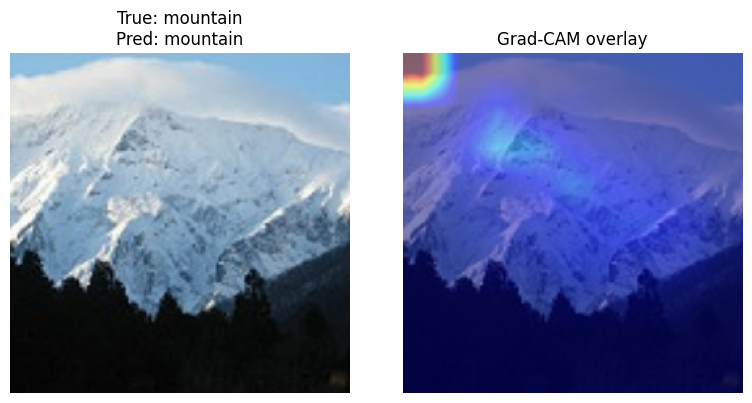

Image index: 512
True label: forest, Predicted: forest


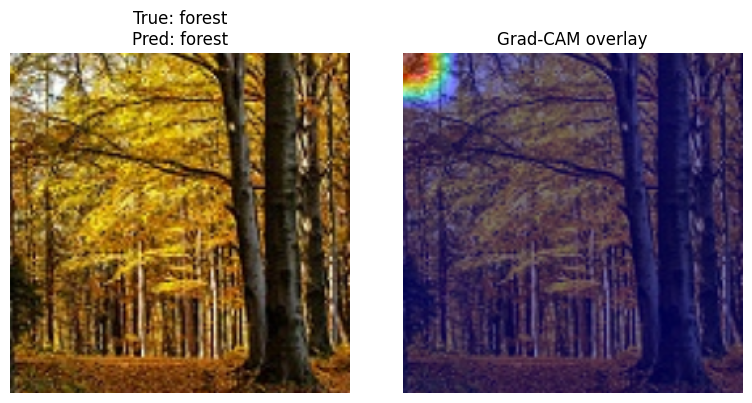

Image index: 1445
True label: mountain, Predicted: mountain


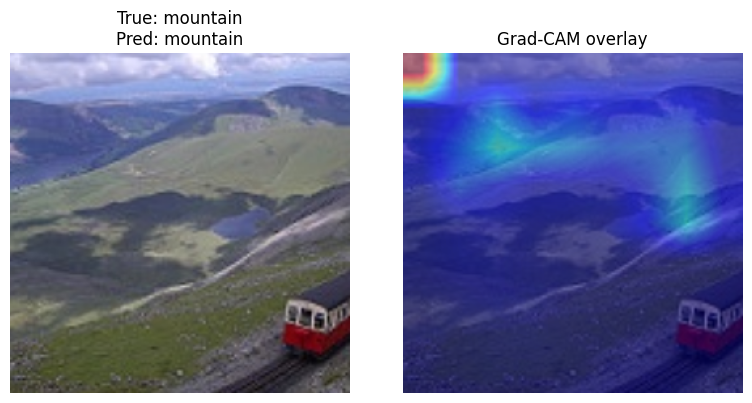

Image index: 852
True label: glacier, Predicted: glacier


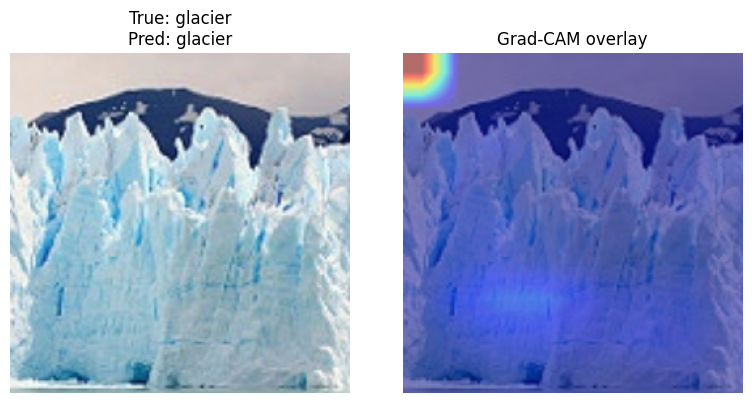

Image index: 1662
True label: mountain, Predicted: mountain


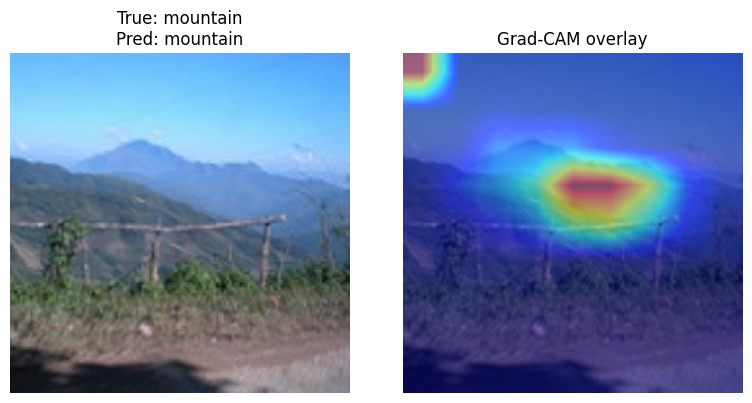

Image index: 1724
True label: sea, Predicted: sea


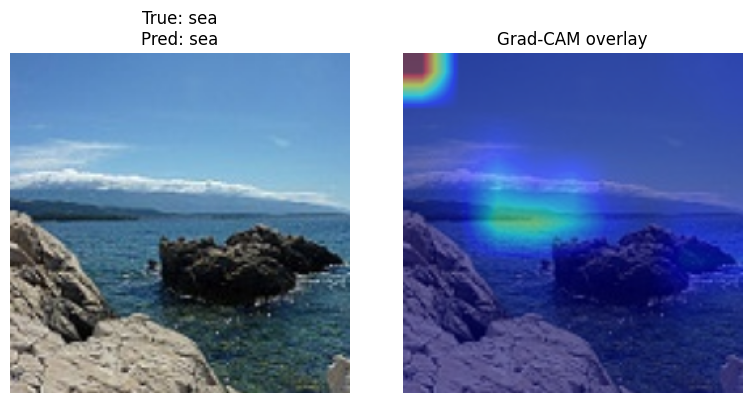

Image index: 1711
True label: sea, Predicted: sea


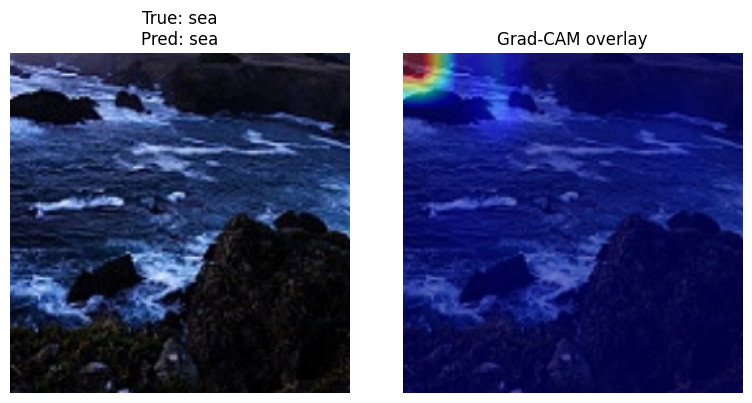

Image index: 1886
True label: sea, Predicted: sea


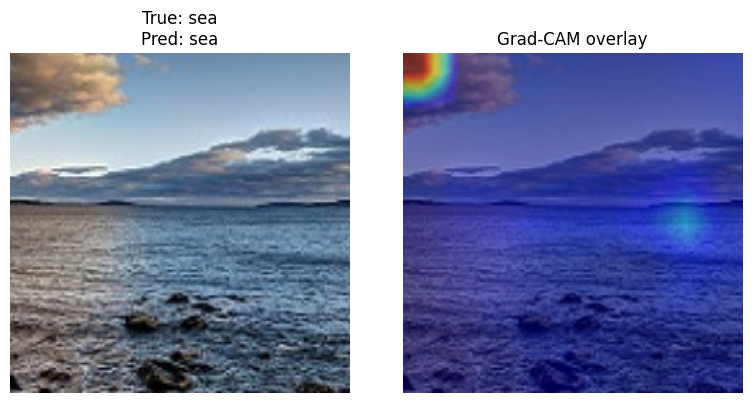

Image index: 1852
True label: sea, Predicted: sea


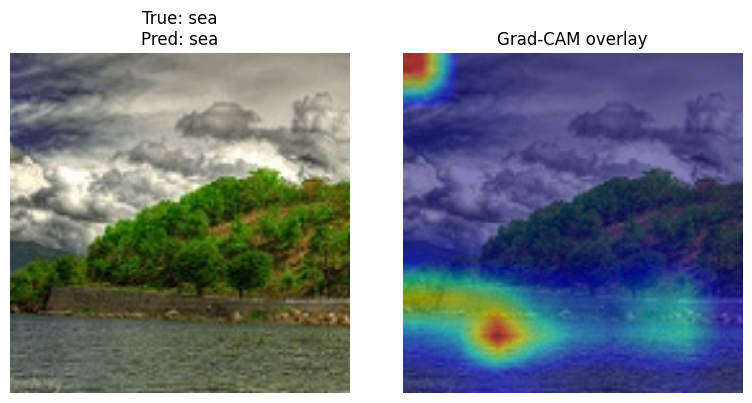

Image index: 1818
True label: sea, Predicted: sea


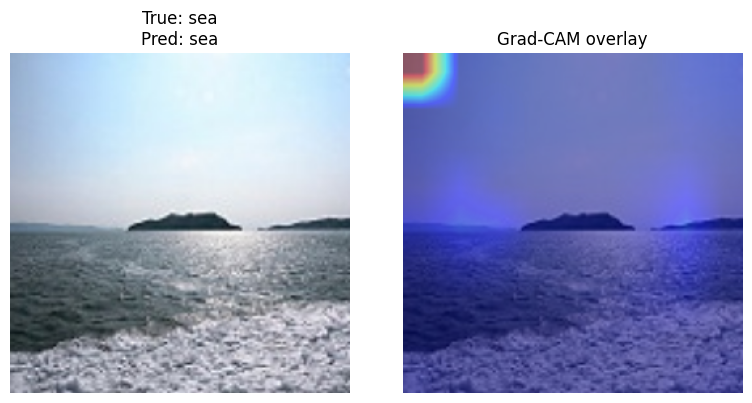

In [9]:
from pathlib import Path
import random

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

from PIL import Image
import matplotlib.pyplot as plt

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 260   # must match training for this model
BATCH_SIZE  = 32
NUM_WORKERS = 4

CKPT_PATH   = "/kaggle/working/efficientnet_b2_phaseC_cbam_best_f1.pth"
N_SAMPLES   = 10     # number of random test images to visualize
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Transforms ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

vis_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),
    transforms.CenterCrop(IMG_SIZE),
])

# --------- Test dataset & loader ---------
test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=eval_transforms)
test_loader  = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

class_names = test_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print("Test samples:", len(test_dataset))

# --------- CBAM modules (same as training) ---------
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        hidden = max(in_channels // reduction, 1)
        self.mlp = nn.Sequential(
            nn.Linear(in_channels, hidden, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(hidden, in_channels, bias=False),
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg = self.avg_pool(x).view(b, c)
        mx  = self.max_pool(x).view(b, c)
        att = self.mlp(avg) + self.mlp(mx)
        att = self.sigmoid(att).view(b, c, 1, 1)
        return x * att


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = (kernel_size - 1) // 2
        self.conv = nn.Conv2d(2, 1, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg = torch.mean(x, dim=1, keepdim=True)
        mx, _ = torch.max(x, dim=1, keepdim=True)
        x_cat = torch.cat([avg, mx], dim=1)
        att = self.conv(x_cat)
        att = self.sigmoid(att)
        return x * att


class CBAM(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super().__init__()
        self.ca = ChannelAttention(in_channels, reduction=reduction)
        self.sa = SpatialAttention(kernel_size=kernel_size)

    def forward(self, x):
        x = self.ca(x)
        x = self.sa(x)
        return x

# --------- Model architecture (same as Phase C) ---------
class EffNetB2_CBAM_Head(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        base = efficientnet_b2(weights=EfficientNet_B2_Weights.IMAGENET1K_V1)
        self.features = base.features

        feat_channels = base.classifier[1].in_features
        self.cbam = CBAM(feat_channels, reduction=16, kernel_size=7)

        self.gap = nn.AdaptiveAvgPool2d(1)
        self.gmp = nn.AdaptiveMaxPool2d(1)

        head_in = feat_channels * 2  # GAP + GMP
        self.classifier = nn.Sequential(
            nn.Linear(head_in, 512),
            nn.SiLU(inplace=True),
            nn.Dropout(p=0.4),
            nn.Linear(512, num_classes),
        )

    def forward(self, x):
        x = self.features(x)      # [B, C, H, W]
        x = self.cbam(x)          # CBAM output
        gap = self.gap(x).view(x.size(0), -1)
        gmp = self.gmp(x).view(x.size(0), -1)
        feat = torch.cat([gap, gmp], dim=1)
        logits = self.classifier(feat)
        return logits

model = EffNetB2_CBAM_Head(num_classes=num_classes).to(device)
state_dict = torch.load(CKPT_PATH, map_location=device)
model.load_state_dict(state_dict)
model.eval()
print("Loaded weights from:", CKPT_PATH)

# --------- Grad-CAM implementation ---------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.handles = []
        self._register_hooks()

    def _register_hooks(self):
        def fwd_hook(module, inp, out):
            self.activations = out.detach()

        def bwd_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        self.handles.append(self.target_layer.register_forward_hook(fwd_hook))
        self.handles.append(self.target_layer.register_backward_hook(bwd_hook))

    def __del__(self):
        for h in self.handles:
            h.remove()

    def generate(self, input_tensor, target_class=None):
        self.model.eval()
        self.model.zero_grad()

        output = self.model(input_tensor)
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        score = output[0, target_class]
        score.backward()

        grads = self.gradients[0]   # [C, H, W]
        acts  = self.activations[0] # [C, H, W]

        weights = grads.mean(dim=(1, 2))  # [C]

        cam = torch.zeros(acts.shape[1:], dtype=torch.float32, device=acts.device)
        for c, w in enumerate(weights):
            cam += w * acts[c, :, :]

        cam = F.relu(cam)
        cam -= cam.min()
        cam /= (cam.max() + 1e-8)
        return cam.cpu().numpy(), target_class

def show_gradcam_on_image(pil_img, cam, pred_class, true_class, class_names,
                          alpha=0.5, title_prefix=""):
    img_vis = vis_transforms(pil_img)
    img_np = np.array(img_vis).astype(np.float32) / 255.0

    cam_tensor = torch.tensor(cam).unsqueeze(0).unsqueeze(0)
    cam_resized = F.interpolate(
        cam_tensor,
        size=(img_np.shape[0], img_np.shape[1]),
        mode="bilinear",
        align_corners=False,
    ).squeeze().numpy()
    cam_resized = np.clip(cam_resized, 0, 1)

    heatmap = plt.cm.jet(cam_resized)[..., :3]
    overlay = alpha * heatmap + (1 - alpha) * img_np
    overlay = np.clip(overlay, 0, 1)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.axis("off")
    plt.title(f"{title_prefix}True: {class_names[true_class]}\nPred: {class_names[pred_class]}")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Grad-CAM overlay")
    plt.tight_layout()
    plt.show()

# --------- Use Grad-CAM on random test images ---------
target_layer = model.cbam  # we want CBAM output as the feature map
gradcam = GradCAM(model, target_layer=target_layer)

for _ in range(N_SAMPLES):
    idx = random.randint(0, len(test_dataset) - 1)
    img_path, true_label = test_dataset.samples[idx]
    pil_img = Image.open(img_path).convert("RGB")

    input_tensor = eval_transforms(pil_img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(input_tensor)
        pred_class = logits.argmax(dim=1).item()

    cam, target_class = gradcam.generate(input_tensor, target_class=pred_class)

    print(f"Image index: {idx}")
    print(f"True label: {class_names[true_label]}, Predicted: {class_names[pred_class]}")

    show_gradcam_on_image(
        pil_img,
        cam,
        pred_class=pred_class,
        true_class=true_label,
        class_names=class_names,
        alpha=0.5,
        title_prefix="",
    )

# EfficientNet‑B2 + CBAM + multi‑scale pooling (mid + final) + MLP head

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Train samples: 11917
Val samples:   2551
Test samples:  2562
Epoch [01/30] - 149.0s | Train loss: 0.4627, acc: 0.8312 | Val loss: 0.2061, acc: 0.9220, F1(macro): 0.9226
Epoch [02/30] - 148.1s | Train loss: 0.2507, acc: 0.9134 | Val loss: 0.1992, acc: 0.9310, F1(macro): 0.9315
Epoch [03/30] - 148.8s | Train loss: 0.1958, acc: 0.9317 | Val loss: 0.1894, acc: 0.9361, F1(macro): 0.9368
Epoch [04/30] - 148.3s | Train loss: 0.1739, acc: 0.9367 | Val loss: 0.1864, acc: 0.9353, F1(macro): 0.9358
Epoch [05/30] - 149.1s | Train loss: 0.1431, acc: 0.9477 | Val loss: 0.2098, acc: 0.9318, F1(macro): 0.9330
Epoch [06/30] - 149.1s | Train loss: 0.1262, acc: 0.9543 | Val loss: 0.1878, acc: 0.9381, F1(macro): 0.9385
Epoch [07/30] - 149.0s | Train loss: 0.1135, acc: 0.9571 | Val loss: 0.2246, acc: 0.9353, F1(macro): 0.9360
Epoch [08/30] - 148.9s | Train loss: 0.0992, acc: 0.9653 | Val loss: 0.2005, acc: 0.9404, F

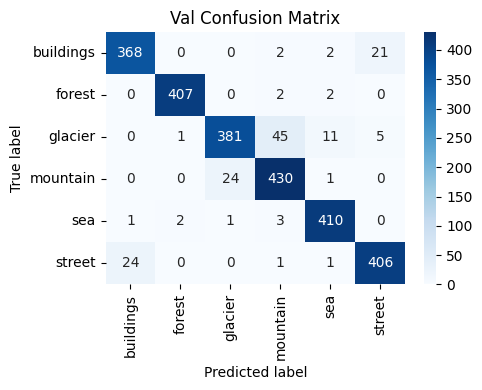


=== TEST CLASSIFICATION REPORT ===
              precision    recall  f1-score   support

   buildings     0.9312    0.9595    0.9451       395
      forest     0.9927    0.9879    0.9903       413
     glacier     0.9450    0.8494    0.8947       445
    mountain     0.8735    0.9519    0.9110       457
         sea     0.9624    0.9761    0.9692       419
      street     0.9644    0.9376    0.9508       433

    accuracy                         0.9426      2562
   macro avg     0.9449    0.9437    0.9435      2562
weighted avg     0.9439    0.9426    0.9425      2562

test accuracy: 0.9426
test F1 (macro): 0.9435


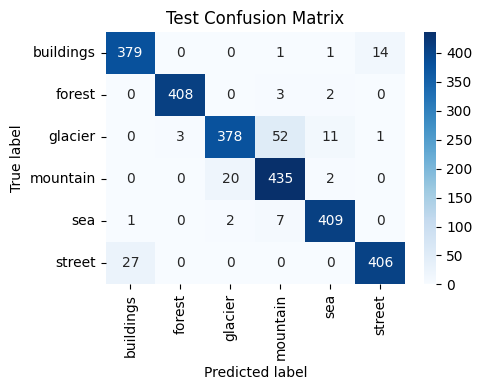

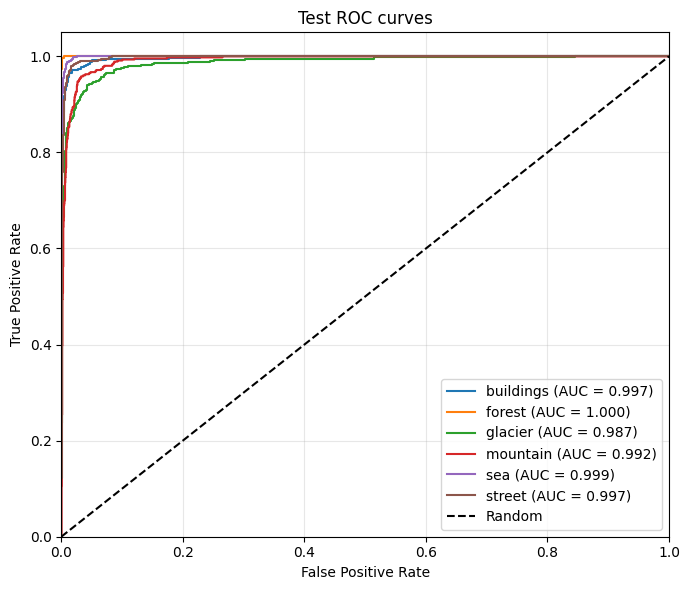


=== TEST AUC SCORES ===
Class buildings      : AUC = 0.9969
Class forest         : AUC = 1.0000
Class glacier        : AUC = 0.9870
Class mountain       : AUC = 0.9917
Class sea            : AUC = 0.9994
Class street         : AUC = 0.9973
Macro-average AUC: 0.9953


In [10]:
from pathlib import Path
import time

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    f1_score,
)
from sklearn.preprocessing import label_binarize

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TRAIN_DIR = DATA_ROOT / "train"
VAL_DIR   = DATA_ROOT / "val"
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 260   # change to 260 if desired
BATCH_SIZE  = 32
NUM_WORKERS = 4
NUM_EPOCHS  = 30
LR          = 1e-4
WEIGHT_DECAY = 1e-4
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Transforms (same as Phase B/C) ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.6, 1.0), ratio=(0.75, 1.33)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.02,
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
    transforms.RandomErasing(
        p=0.2,
        scale=(0.02, 0.08),
        ratio=(0.3, 3.3),
        value="random",
    ),
])

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# --------- Datasets & Dataloaders ---------
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=VAL_DIR,   transform=eval_transforms)
test_dataset  = datasets.ImageFolder(root=TEST_DIR,  transform=eval_transforms)

class_names = train_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print(f"Train samples: {len(train_dataset)}")
print(f"Val samples:   {len(val_dataset)}")
print(f"Test samples:  {len(test_dataset)}")

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

# --------- CBAM modules (same as in Phase C) ---------
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        hidden = max(in_channels // reduction, 1)
        self.mlp = nn.Sequential(
            nn.Linear(in_channels, hidden, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(hidden, in_channels, bias=False),
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg = self.avg_pool(x).view(b, c)
        mx  = self.max_pool(x).view(b, c)
        att = self.mlp(avg) + self.mlp(mx)
        att = self.sigmoid(att).view(b, c, 1, 1)
        return x * att


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = (kernel_size - 1) // 2
        self.conv = nn.Conv2d(2, 1, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg = torch.mean(x, dim=1, keepdim=True)
        mx, _ = torch.max(x, dim=1, keepdim=True)
        x_cat = torch.cat([avg, mx], dim=1)
        att = self.conv(x_cat)
        att = self.sigmoid(att)
        return x * att


class CBAM(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super().__init__()
        self.ca = ChannelAttention(in_channels, reduction=reduction)
        self.sa = SpatialAttention(kernel_size=kernel_size)

    def forward(self, x):
        x = self.ca(x)
        x = self.sa(x)
        return x

# --------- EfficientNet-B2 with CBAM + multi-scale pooling + MLP head ---------
class EffNetB2_CBAM_MultiScale(nn.Module):
    def __init__(self, num_classes, img_size=224):
        super().__init__()
        base = efficientnet_b2(weights=EfficientNet_B2_Weights.IMAGENET1K_V1)
        self.features = base.features

        # choose an intermediate index (2 blocks before last) for mid-level feature
        self.num_blocks = len(self.features)
        self.mid_idx = self.num_blocks - 3  # heuristic: near top but still higher spatial res

        # find channel dims for mid and final features via a dummy forward
        with torch.no_grad():
            dummy = torch.zeros(1, 3, img_size, img_size)
            x = dummy
            mid_feat = None
            for i, block in enumerate(self.features):
                x = block(x)
                if i == self.mid_idx:
                    mid_feat = x
            final_feat = x

        c_mid   = mid_feat.shape[1]
        c_final = final_feat.shape[1]

        self.cbam = CBAM(c_final, reduction=16, kernel_size=7)

        self.gap = nn.AdaptiveAvgPool2d(1)
        self.gmp = nn.AdaptiveMaxPool2d(1)

        head_in = 2 * c_mid + 2 * c_final  # GAP + GMP for both mid and final
        self.classifier = nn.Sequential(
            nn.Linear(head_in, 512),
            nn.SiLU(inplace=True),
            nn.Dropout(p=0.4),
            nn.Linear(512, num_classes),
        )

    def forward(self, x):
        mid_feat = None
        for i, block in enumerate(self.features):
            x = block(x)
            if i == self.mid_idx:
                mid_feat = x

        x_final = self.cbam(x)

        b = x.size(0)
        mid_gap = self.gap(mid_feat).view(b, -1)
        mid_gmp = self.gmp(mid_feat).view(b, -1)

        fin_gap = self.gap(x_final).view(b, -1)
        fin_gmp = self.gmp(x_final).view(b, -1)

        feat = torch.cat([mid_gap, mid_gmp, fin_gap, fin_gmp], dim=1)
        logits = self.classifier(feat)
        return logits

model = EffNetB2_CBAM_MultiScale(num_classes=num_classes, img_size=IMG_SIZE).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

# --------- Training / Validation (best by val macro-F1) ---------
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in dataloader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        logits = model(images)
        loss = loss_fn(logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / total, correct / total

def evaluate_epoch(model, dataloader, loss_fn, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            logits = model(images)
            loss = loss_fn(logits, labels)

            running_loss += loss.item() * images.size(0)
            preds = logits.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())

    epoch_loss = running_loss / total
    epoch_acc  = correct / total
    all_preds  = torch.cat(all_preds).numpy()
    all_labels = torch.cat(all_labels).numpy()
    epoch_f1   = f1_score(all_labels, all_preds, average="macro")
    return epoch_loss, epoch_acc, epoch_f1

best_val_f1 = 0.0
best_model_path = "efficientnet_b2_phaseC_multiscale_best_f1.pth"

for epoch in range(1, NUM_EPOCHS + 1):
    start = time.time()
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc, val_f1 = evaluate_epoch(model, val_loader, criterion, device)
    elapsed = time.time() - start

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        torch.save(model.state_dict(), best_model_path)

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] - {elapsed:.1f}s | "
        f"Train loss: {train_loss:.4f}, acc: {train_acc:.4f} | "
        f"Val loss: {val_loss:.4f}, acc: {val_acc:.4f}, F1(macro): {val_f1:.4f}"
    )

print("Best val F1 (macro, Phase C+ - multi-scale):", best_val_f1)

# --------- Load best model ---------
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.to(device)
model.eval()

# --------- Evaluation helpers ---------
def get_all_predictions(model, dataloader, device):
    model.eval()
    all_logits, all_labels = [], []
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            logits = model(images)
            all_logits.append(logits.cpu())
            all_labels.append(labels.cpu())
    all_logits = torch.cat(all_logits, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    y_proba = F.softmax(all_logits, dim=1).numpy()
    y_pred = np.argmax(y_proba, axis=1)
    y_true = all_labels.numpy()
    return y_true, y_pred, y_proba

def evaluate_split(model, dataloader, class_names, device, split_name="val"):
    y_true, y_pred, y_proba = get_all_predictions(model, dataloader, device)

    print(f"\n=== {split_name.upper()} CLASSIFICATION REPORT ===")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    acc = (y_true == y_pred).mean()
    macro_f1 = f1_score(y_true, y_pred, average="macro")
    print(f"{split_name} accuracy: {acc:.4f}")
    print(f"{split_name} F1 (macro): {macro_f1:.4f}")

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(f"{split_name.capitalize()} Confusion Matrix")
    plt.tight_layout()
    plt.show()

    return y_true, y_pred, y_proba

def plot_multiclass_roc_auc(y_true, y_proba, class_names, split_name="test"):
    n_classes = len(class_names)
    y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

    fpr, tpr, auc_scores = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        auc_scores[i] = roc_auc_score(y_true_bin[:, i], y_proba[:, i])
    macro_auc = np.mean(list(auc_scores.values()))

    plt.figure(figsize=(7, 6))
    for i in range(n_classes):
        plt.plot(
            fpr[i],
            tpr[i],
            label=f"{class_names[i]} (AUC = {auc_scores[i]:.3f})",
        )
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{split_name.capitalize()} ROC curves")
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"\n=== {split_name.upper()} AUC SCORES ===")
    for i in range(n_classes):
        print(f"Class {class_names[i]:15s}: AUC = {auc_scores[i]:.4f}")
    print(f"Macro-average AUC: {macro_auc:.4f}")

# --------- Final evaluation on VAL and TEST ---------
y_val_true,  y_val_pred,  y_val_proba  = evaluate_split(
    model, val_loader,  class_names, device, split_name="val"
)
y_test_true, y_test_pred, y_test_proba = evaluate_split(
    model, test_loader, class_names, device, split_name="test"
)
plot_multiclass_roc_auc(
    y_test_true, y_test_proba, class_names, split_name="test"
)

# XAI 

Using device: cuda
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Test samples: 2562
Loaded weights from: /kaggle/working/efficientnet_b2_phaseC_multiscale_best_f1.pth
Image index: 1591
True label: mountain, Predicted: mountain


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


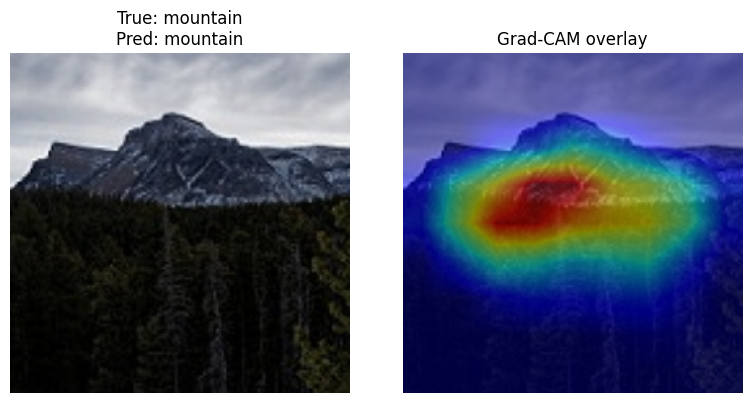

Image index: 1898
True label: sea, Predicted: sea


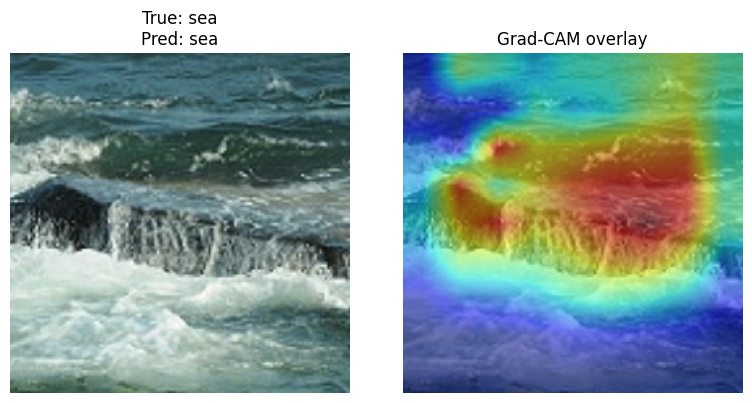

Image index: 1489
True label: mountain, Predicted: glacier


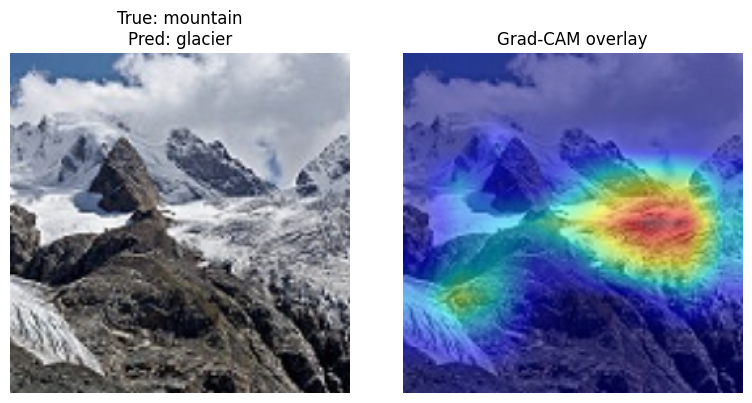

Image index: 1383
True label: mountain, Predicted: mountain


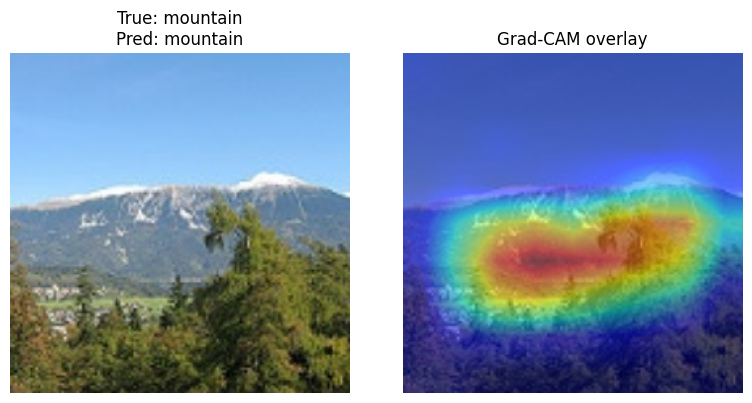

Image index: 1335
True label: mountain, Predicted: mountain


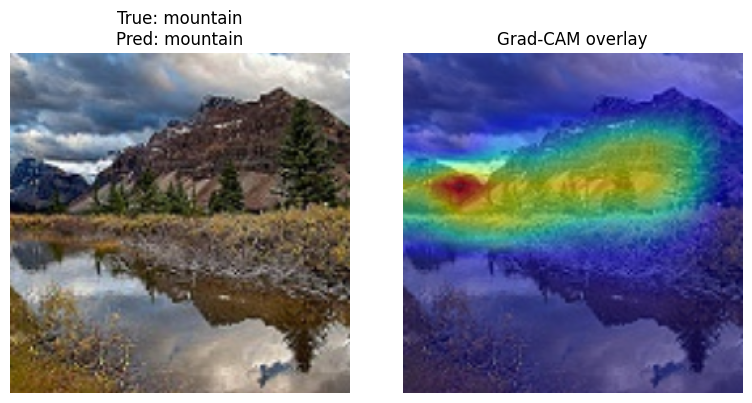

In [11]:
from pathlib import Path
import random

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

from PIL import Image
import matplotlib.pyplot as plt

# ================== CONFIG ==================
DATA_ROOT = Path("/kaggle/working/Intel-image-classification")
TEST_DIR  = DATA_ROOT / "test"

IMG_SIZE    = 260   # must match training for this model
BATCH_SIZE  = 32
NUM_WORKERS = 4

CKPT_PATH   = "/kaggle/working/efficientnet_b2_phaseC_multiscale_best_f1.pth"
N_SAMPLES   = 5
# ============================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Transforms ---------
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

eval_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

vis_transforms = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.14)),
    transforms.CenterCrop(IMG_SIZE),
])

# --------- Test dataset ---------
test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=eval_transforms)
test_loader  = DataLoader(
    test_dataset, batch_size=BATCH_SIZE,
    shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

class_names = test_dataset.classes
num_classes = len(class_names)
print("Classes:", class_names)
print("Test samples:", len(test_dataset))

# --------- CBAM modules (same as in training) ---------
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        hidden = max(in_channels // reduction, 1)
        self.mlp = nn.Sequential(
            nn.Linear(in_channels, hidden, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(hidden, in_channels, bias=False),
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg = self.avg_pool(x).view(b, c)
        mx  = self.max_pool(x).view(b, c)
        att = self.mlp(avg) + self.mlp(mx)
        att = self.sigmoid(att).view(b, c, 1, 1)
        return x * att


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = (kernel_size - 1) // 2
        self.conv = nn.Conv2d(2, 1, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg = torch.mean(x, dim=1, keepdim=True)
        mx, _ = torch.max(x, dim=1, keepdim=True)
        x_cat = torch.cat([avg, mx], dim=1)
        att = self.conv(x_cat)
        att = self.sigmoid(att)
        return x * att


class CBAM(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super().__init__()
        self.ca = ChannelAttention(in_channels, reduction=reduction)
        self.sa = SpatialAttention(kernel_size=kernel_size)

    def forward(self, x):
        x = self.ca(x)
        x = self.sa(x)
        return x

# --------- Multi-scale architecture (same as Phase C+) ---------
class EffNetB2_CBAM_MultiScale(nn.Module):
    def __init__(self, num_classes, img_size=224):
        super().__init__()
        base = efficientnet_b2(weights=EfficientNet_B2_Weights.IMAGENET1K_V1)
        self.features = base.features

        self.num_blocks = len(self.features)
        self.mid_idx = self.num_blocks - 3  # as used in training

        with torch.no_grad():
            dummy = torch.zeros(1, 3, img_size, img_size)
            x = dummy
            mid_feat = None
            for i, block in enumerate(self.features):
                x = block(x)
                if i == self.mid_idx:
                    mid_feat = x
            final_feat = x

        c_mid   = mid_feat.shape[1]
        c_final = final_feat.shape[1]

        self.cbam = CBAM(c_final, reduction=16, kernel_size=7)

        self.gap = nn.AdaptiveAvgPool2d(1)
        self.gmp = nn.AdaptiveMaxPool2d(1)

        head_in = 2 * c_mid + 2 * c_final
        self.classifier = nn.Sequential(
            nn.Linear(head_in, 512),
            nn.SiLU(inplace=True),
            nn.Dropout(p=0.4),
            nn.Linear(512, num_classes),
        )

    def forward(self, x):
        mid_feat = None
        for i, block in enumerate(self.features):
            x = block(x)
            if i == self.mid_idx:
                mid_feat = x

        x_final = self.cbam(x)

        b = x.size(0)
        mid_gap = self.gap(mid_feat).view(b, -1)
        mid_gmp = self.gmp(mid_feat).view(b, -1)
        fin_gap = self.gap(x_final).view(b, -1)
        fin_gmp = self.gmp(x_final).view(b, -1)

        feat = torch.cat([mid_gap, mid_gmp, fin_gap, fin_gmp], dim=1)
        logits = self.classifier(feat)
        return logits

model = EffNetB2_CBAM_MultiScale(num_classes=num_classes, img_size=IMG_SIZE).to(device)
state_dict = torch.load(CKPT_PATH, map_location=device)
model.load_state_dict(state_dict)
model.eval()
print("Loaded weights from:", CKPT_PATH)

# --------- Grad-CAM implementation ---------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.handles = []
        self._register_hooks()

    def _register_hooks(self):
        def fwd_hook(module, inp, out):
            self.activations = out.detach()

        def bwd_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        self.handles.append(self.target_layer.register_forward_hook(fwd_hook))
        self.handles.append(self.target_layer.register_backward_hook(bwd_hook))

    def __del__(self):
        for h in self.handles:
            h.remove()

    def generate(self, input_tensor, target_class=None):
        self.model.eval()
        self.model.zero_grad()

        output = self.model(input_tensor)
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        score = output[0, target_class]
        score.backward()

        grads = self.gradients[0]
        acts  = self.activations[0]

        weights = grads.mean(dim=(1, 2))

        cam = torch.zeros(acts.shape[1:], dtype=torch.float32, device=acts.device)
        for c, w in enumerate(weights):
            cam += w * acts[c, :, :]

        cam = F.relu(cam)
        cam -= cam.min()
        cam /= (cam.max() + 1e-8)
        return cam.cpu().numpy(), target_class

def show_gradcam_on_image(pil_img, cam, pred_class, true_class, class_names,
                          alpha=0.5, title_prefix=""):
    img_vis = vis_transforms(pil_img)
    img_np = np.array(img_vis).astype(np.float32) / 255.0

    cam_tensor = torch.tensor(cam).unsqueeze(0).unsqueeze(0)
    cam_resized = F.interpolate(
        cam_tensor,
        size=(img_np.shape[0], img_np.shape[1]),
        mode="bilinear",
        align_corners=False,
    ).squeeze().numpy()
    cam_resized = np.clip(cam_resized, 0, 1)

    heatmap = plt.cm.jet(cam_resized)[..., :3]
    overlay = alpha * heatmap + (1 - alpha) * img_np
    overlay = np.clip(overlay, 0, 1)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.axis("off")
    plt.title(f"{title_prefix}True: {class_names[true_class]}\nPred: {class_names[pred_class]}")

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Grad-CAM overlay")
    plt.tight_layout()
    plt.show()

# --------- Use Grad-CAM on random test images ---------
target_layer = model.cbam  # Grad-CAM on CBAM output of final scale
gradcam = GradCAM(model, target_layer=target_layer)

for _ in range(N_SAMPLES):
    idx = random.randint(0, len(test_dataset) - 1)
    img_path, true_label = test_dataset.samples[idx]
    pil_img = Image.open(img_path).convert("RGB")

    input_tensor = eval_transforms(pil_img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(input_tensor)
        pred_class = logits.argmax(dim=1).item()

    cam, target_class = gradcam.generate(input_tensor, target_class=pred_class)

    print(f"Image index: {idx}")
    print(f"True label: {class_names[true_label]}, Predicted: {class_names[pred_class]}")

    show_gradcam_on_image(
        pil_img,
        cam,
        pred_class=pred_class,
        true_class=true_label,
        class_names=class_names,
        alpha=0.5,
        title_prefix="",
    )